In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import json
import re
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# spacy for lemmatization
import spacy
sp = spacy.load('en_core_web_sm')
all_stopwords = sp.Defaults.stop_words

#import beautifulsoup
from bs4 import BeautifulSoup

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim  # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline

# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)
                        
# loading NLTK stopwords
import nltk
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from wordcloud import WordCloud
stopwords_nltk = set(stopwords.words('english'))

import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)


Bad key "text.kerning_factor" on line 4 in
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/nltk/decorators.py:68: DeprecationWarning: `formatargspec` is deprecated since Python 3.5. Use `signature` and the `Signature` object directly
  regargs, varargs, varkwargs, defaults, formatvalue=lambda value: ""


In [3]:
#pandas general settings
pd.set_option('display.max_colwidth', 200)

## Problem Statement

Specific text feature frequencies have been used to measure investor sentiments towards stock prices. I intend to use these NLP techniques to explore the relationship between twitter influencers active in the Bitcoin public discourse and whether their bullish or bearish sentiments affect the Bitcoin price. 

https://cointelegraph.com/news/how-traders-can-use-twitter-to-anticipate-bitcoin-price-moves-volume
https://scholar.smu.edu/cgi/viewcontent.cgi?article=1039&context=datasciencereview

I used twitterscraper to collect tweets from the below-mentioned individuals from the 2017-01-01 to 2020-07-01. I have only collected tweets that they have written and not retweets since I am interested in their original content for analysis. 

https://github.com/taspinar/twitterscraper

Here are the list of influencers I have scraped tweets from:

*   Andreas M. Antonopoulos(@aantonop) - Academic, Bitcoin Advocate, tech entrepreneur and author
*   Anthony Pompliano(@APompliano) - Co-founder & Partner at Morgan Creek Digital
*   Brian Armstrong(@brian_armstrong) - Co-founder & CEO at 
Coinbase
*   ₿itcoin Magazine(@BitcoinMagazine) - publication that focuses on bitcoin
*   CoinDesk(@CoinDesk) - cryptocurrency publication
*   DonAlt(@CryptoDonAlt) - Streams technical analysis of cryptocurrencies on youtube and Bitcoin sceptic
*   Changpeng Zhao(@cz_binance) - CEO of Binance, world's largest cryptocurrency exchange
*   Jimmy Song(@jimmysong) - Bitcoin educator, developer and entrepreneur
*   Jameson Lopp(@lopp) - Bitcoin Engineer and CTO of CasaHODL, maintains community pages for users looking to get into Bitcoin
*   Peter Brandt(@PeterLBrandt) - Trader of classical charting principles since 1980
*   Peter Schiff(@PeterSchiff) - Crypto sceptic
*   Dovey Wan(@DoveyWan) - Crypto-analyst and advisor to Coindesk
*   Vijay Boyapati(@real_vijay) - wrote The Bullish Case for Bitcoin
*   Roger Ver(@rogerkver) - World's first Investor in Bitcoin startups including http://Bitcoin.com, http://Blockchain.com, Ripple, http://Z.cash, BitPay, Kraken, http://Purse.io
*   Saifedean Ammous(@saifedean) - Author of Bitcoin Standard
*   Stephan Livera(@stephanlivera) - #Bitcoin Podcaster, co-founder @ministryofnodes, partner @bitcoinervc
*   Cameron Winklevoss(@winklevoss) - early Bitcoin investor and founder of Winklevoss Capital Management and Gemini cryptocurrency exchange
*   Tyler Winklevoss(@tylerwinklevoss) - early Bitcoin investor and founder of Winklevoss Capital Management and Gemini cryptocurrency exchange (also CEO)
*   Vitalik Buterin(@VitalikButerin) - co-founder of Ethereum, second largest cryptocurrency by market cap after Bitcoin

## Reading in our webscraped data and bitcoin price

In [4]:
aantonop = pd.read_json('./datasets/aantonop_tweets_since_2017.json')
APompliano = pd.read_json('./datasets/APompliano_tweets_since_2017.json')
brian_armstrong = pd.read_json('./datasets/brian_armstrong_tweets_since_2017.json')
BitcoinMagazine = pd.read_json('./datasets/BitcoinMagazine_tweets_since_2017.json')
CoinDesk = pd.read_json('./datasets/CoinDesk_tweets_since_2017.json')
CryptoDonAlt = pd.read_json('./datasets/CryptoDonAlt_tweets_since_2017.json')
cz_binance = pd.read_json('./datasets/cz_binance_tweets_since_2017.json')
jimmysong = pd.read_json('./datasets/jimmysong_tweets_since_2017.json')
lopp = pd.read_json('./datasets/lopp_tweets_since_2017.json')
PeterLBrandt = pd.read_json('./datasets/PeterLBrandt_tweets_since_2017.json')
PeterSchiff = pd.read_json('./datasets/PeterSchiff_tweets_since_2017.json')
DoveyWan = pd.read_json('./datasets/DoveyWan_tweets_since_2017.json')
real_vijay = pd.read_json('./datasets/real_vijay_tweets_since_2017.json')
rogerkver = pd.read_json('./datasets/rogerkver_tweets_since_2017.json')
saifedean = pd.read_json('./datasets/saifedean_tweets_since_2017.json')
stephanlivera = pd.read_json('./datasets/stephanlivera_tweets_since_2017.json')
winklevoss = pd.read_json('./datasets/winklevoss_tweets_since_2017.json')
tylerwinklevoss = pd.read_json('./datasets/tylerwinklevoss_tweets_since_2017.json')
VitalikButerin = pd.read_json('./datasets/VitalikButerin_tweets_since_2017.json')
bitcoin_price = pd.read_csv('./datasets/coinmarketcapBitcoinPrice.csv')

In [5]:
#measuring a influencers' reach and content
def top_posts(df):
    top_10_liked_posts = df[['text','likes','retweets', 'timestamp']].sort_values('likes', ascending=False).head(10)

    return top_10_liked_posts

def top_retweets(df):
    top_10_retweeted_posts = df[['text','likes','retweets', 'timestamp']].sort_values('retweets', ascending=False).head(10)
    
    return top_10_retweeted_posts

def wordcloud_generator(df):
    wordcloud = WordCloud(stopwords=all_stopwords,
                          width = 2000,
                          height=1000,
                          background_color="black").generate(str(df['text'].values))

    plt.figure(figsize=(16,9))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off");
    
def cleaned_wordcloud_generator(df):
    wordcloud = WordCloud(stopwords=all_stopwords,
                          width = 2000,
                          height=1000,
                          background_color="black").generate(str(df['cleaned_tweets'].values))

    plt.figure(figsize=(16,9))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off");

In [6]:
# function for cleaning tweets

# stopwords that we want to remove from the corpus
stop_words = set(stopwords.words('english'))
new_stopwords = ['twitter', 
                 'pictwittercom', 
                 'bitcoin_magazine',
                 'kopi',
                 'luwak',
                 'try',
                 'civet',
                 'coffee',
                 'bean',
                 'com',
                 'pic',
                 'http',
                 'https']
new_stopwords_list = stop_words.union(new_stopwords)
custom_stopwords = set([word for word in new_stopwords_list])

lemmatizer = WordNetLemmatizer()

def tweets_to_words(raw_post):
    
 
    review_text = BeautifulSoup(raw_post).get_text()
    letters_only = re.sub("(@[A-Za-z]+)|([^A-Za-z \t])|(\w+:\/\/\S+)", " ", review_text)
    words = letters_only.lower().split()
    stops = set(custom_stopwords)
    meaningful_words = [w for w in words if w not in stops]
    meaningful_words = [lemmatizer.lemmatize(word) for word in meaningful_words]
    
    return(" ".join(meaningful_words))

def cleaning_tweets(df):
    cleaned_tweets = []
    
    for tweets in df['text']:
        cleaned_tweets.append(tweets_to_words(tweets))
    
    df['cleaned_tweets'] = cleaned_tweets
    
    return df['cleaned_tweets']

In [7]:
#given the character limit for twitter, we like to combine the tweets for the day to have 
#a bigger bag of words per document to train our model on

def set_date(df):

    # Extracting the only the date of the tweet
    df['tweet_day'] = df['timestamp'].map(lambda x: x.date())
    df['tweet_day'] = pd.to_datetime(df['tweet_day'])
    
    return df

In [8]:
df = aantonop.append([
        APompliano,
        brian_armstrong,
        BitcoinMagazine,
        CoinDesk,
        CryptoDonAlt,
        cz_binance,
        jimmysong,
        lopp,
        PeterLBrandt,
        PeterSchiff,
        DoveyWan,
        real_vijay,
        rogerkver,
        saifedean,
        stephanlivera,
        winklevoss,
        tylerwinklevoss,
        VitalikButerin
])

In [9]:
#duplicated_tweets = df[df['tweet_id']=='tweet_id']
df.drop_duplicates(subset='tweet_id', inplace=True)
df.set_index('timestamp', inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 142708 entries, 2018-08-03 13:24:35 to 2020-03-07 07:03:37
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   has_media         142708 non-null  bool          
 1   hashtags          142708 non-null  object        
 2   img_urls          142708 non-null  object        
 3   is_replied        142708 non-null  bool          
 4   is_reply_to       142708 non-null  bool          
 5   likes             142708 non-null  int64         
 6   links             142708 non-null  object        
 7   parent_tweet_id   142708 non-null  object        
 8   replies           142708 non-null  int64         
 9   reply_to_users    142708 non-null  object        
 10  retweets          142708 non-null  int64         
 11  screen_name       142708 non-null  object        
 12  text              142708 non-null  object        
 13  text_html         142708 

## Some preliminary EDA 

What I am looking out for is whether I will have sufficient tweets to cover the time period where I will be analysing the bitcoin price. 

In [10]:
df['screen_name'].value_counts()

APompliano         13569
CoinDesk           13170
saifedean          12509
CryptoDonAlt       12324
PeterLBrandt       12029
stephanlivera      11547
lopp               11486
VitalikButerin      9991
PeterSchiff         7774
aantonop            6598
jimmysong           6127
real_vijay          5971
DoveyWan            5366
BitcoinMagazine     5098
cz_binance          4894
tylerwinklevoss     2068
rogerkver           1014
winklevoss           720
brian_armstrong      453
Name: screen_name, dtype: int64

Consider dropping Cameron Winklevoss and Brian Armstrong as they do not look to have sufficient tweets over the period of time we are interested in. 

In [11]:
# top 10 liked tweets from all influencers
df[['screen_name','text','likes','retweets']].sort_values('likes', ascending=False).head(10)

,screen_name,text,likes,retweets
timestamp,,,,
2018-12-09 20:01:25,DoveyWan,Perspective matters ...pic.twitter.com/BOk7p4z7Ex,59913,34471
2018-03-24 12:06:36,APompliano,"The smartest people I know:\n\n1. Admit they know very little\n2. Constantly seek more info\n3. Encourage intellectual debate\n4. Have strong opinions, loosely held\n5. Are comfortable being wrong...",35051,13833
2020-07-06 17:10:06,APompliano,"Harvard just announced they’re charging the full $50k a year for 100% remote classes this coming year.\n\nMaybe kids should just listen to podcasts, watch YouTube, and read books instead.",30158,4717
2020-06-27 19:04:14,PeterSchiff,"Since Princeton University is removing Woodrow Wilson's name from its buildings due to his racist thinking and policies, I think we should also repeal the Federal Income Tax and The Federal Reserv...",25476,7958
2018-12-26 13:49:35,rogerkver,Industries lobbying against legal marijuana - \n\n* Alcohol *\n* Tobacco * \n* Big pharma * \n* Police unions *\n* Private prisons *\n* Prison guard unions *\n\nThe same ones that stand to lose mo...,22898,8025
2020-07-12 15:12:18,APompliano,Bang bang! Game over. I win. pic.twitter.com/7pIx77EdMy,19037,469
2018-02-17 12:25:29,VitalikButerin,"Reminder: cryptocurrencies are still a new and hyper-volatile asset class, and could drop to near-zero at any time. Don't put in more money than you can afford to lose. If you're trying to figure ...",15719,5811
2018-05-26 14:20:45,APompliano,"US student debt just hit $1.4 TRILLION.\n\n$1,400,000,000,000\n\nWe’re watching the government & banks steal a generation’s future right in front of our eyes.",14959,6088
2019-04-12 04:45:46,cz_binance,"Craig Wright is not Satoshi.\n\nAnymore of this sh!t, we delist!https://twitter.com/BitcoinMagazine/status/1116379149998940161 …",14807,3848


Anthony Pompliano who also has the most number of tweets among the influencers also has the most representation in the top 10 tweets according to 'likes' in the group. Conversely Roger Ver who tweeted much less than Anthony takes fifth place in the most 'likes' post list. 

In [12]:
# top 10 retweets posts from all influencers
df[['screen_name','text','likes','retweets']].sort_values('retweets', ascending=False).head(10)

,screen_name,text,likes,retweets
timestamp,,,,
2018-12-09 20:01:25,DoveyWan,Perspective matters ...pic.twitter.com/BOk7p4z7Ex,59913,34471
2017-12-14 00:19:21,rogerkver,"Since Bitcoin Core is no longer usable as a currency, we should no longer consider it to be a crypto currency.",3115,19148
2017-11-10 18:33:57,rogerkver,If reality is contradicting your preconceived opinions then your premises are likely flawed. Study economics to understand why #BitcoinCash will win wider adoption than 1MB Segwit Bitoin shortly....,1183,13851
2018-03-24 12:06:36,APompliano,"The smartest people I know:\n\n1. Admit they know very little\n2. Constantly seek more info\n3. Encourage intellectual debate\n4. Have strong opinions, loosely held\n5. Are comfortable being wrong...",35051,13833
2018-12-26 13:49:35,rogerkver,Industries lobbying against legal marijuana - \n\n* Alcohol *\n* Tobacco * \n* Big pharma * \n* Police unions *\n* Private prisons *\n* Prison guard unions *\n\nThe same ones that stand to lose mo...,22898,8025
2020-06-27 19:04:14,PeterSchiff,"Since Princeton University is removing Woodrow Wilson's name from its buildings due to his racist thinking and policies, I think we should also repeal the Federal Income Tax and The Federal Reserv...",25476,7958
2017-12-12 03:55:08,VitalikButerin,Right now my favorite token model is OMG-style staking tokens. Reasons:\n\n* Not a medium-of-exchange token\n* Clear valuation model (expected discounted future tx fees minus node operation cost)\...,3818,7870
2018-05-26 14:20:45,APompliano,"US student debt just hit $1.4 TRILLION.\n\n$1,400,000,000,000\n\nWe’re watching the government & banks steal a generation’s future right in front of our eyes.",14959,6088
2018-02-17 12:25:29,VitalikButerin,"Reminder: cryptocurrencies are still a new and hyper-volatile asset class, and could drop to near-zero at any time. Don't put in more money than you can afford to lose. If you're trying to figure ...",15719,5811


In [13]:
#total number of likes per influencer
df.groupby('screen_name')['likes'].sum().sort_values(ascending=False)

screen_name
APompliano         2220551
cz_binance         2073473
PeterSchiff        1814798
PeterLBrandt       1591432
lopp               1375019
CoinDesk           1357786
VitalikButerin     1080556
aantonop            841822
CryptoDonAlt        743725
jimmysong           679291
rogerkver           608316
tylerwinklevoss     467425
saifedean           387357
winklevoss          262205
BitcoinMagazine     250634
DoveyWan            233942
real_vijay          230474
stephanlivera       221102
brian_armstrong     180043
Name: likes, dtype: int64

In [14]:
#total number of retweets per influencer
df.groupby('screen_name')['retweets'].sum().sort_values(ascending=False)

screen_name
CoinDesk           660067
APompliano         448080
PeterSchiff        392574
cz_binance         356573
PeterLBrandt       313526
lopp               296279
VitalikButerin     228091
aantonop           212534
rogerkver          190065
jimmysong          127429
BitcoinMagazine    114100
tylerwinklevoss     76752
saifedean           70092
DoveyWan            61955
CryptoDonAlt        57665
winklevoss          41404
real_vijay          38268
brian_armstrong     33739
stephanlivera       29963
Name: retweets, dtype: int64

Now we will review each influencer's tweets and determine if they make the final shortlist. I had also discovered in my inital classification model that I might not have sufficient words and variety of words for a model to make accurate classifications. The decision was then made to concat each influencer's tweets for the day into a single cell to be compared against the Bitcoin price index.

In [15]:
aantonop.drop_duplicates(subset='tweet_id', inplace=True)
top_retweets(aantonop)

,text,likes,retweets,timestamp
5481,"So while the banking regulators in India were bashing bitcoin for being ""unregulated"", a $2 bn fraud ring was growing under their noses. One of their biggest banks (regulated) was doing all the mo...",10233,4703,2018-02-19 23:39:51
5196,"The CLOUD Act passed. It destroys privacy globally, so it had to be snuck into the $1.3 trillion omnibus without debate. \n\nEncrypt. Encrypt. Encrypt. Go Dark.\n\n When privacy is criminalized, o...",5792,4690,2018-03-23 18:24:21
289,"While Facebook's Libra doesn't compete against any open, public, permissionless, borderless, neutral, censorship-resistant blockchains, it *will* compete against both retail banks and central bank...",8369,2943,2019-06-18 11:02:48
5591,"The internet enabled the free flow of information, terrifying those who wanted to control communication. #Bitcoin enables the free flow of value, terrifying those who want to control your money.\n...",5541,2816,2018-01-28 21:52:00
1892,This is a good time to step away from screens. \n\nDecorate your Merkle Tree\nWater your bloom filters\nCelebrate Cryptmas with your family. \n\nIt will all be waiting here next week. \n\nHappy Ev...,8202,2000,2017-12-22 15:00:22
3478,The Equifax service to check if your data was compromised requires you to opt-out of class action against them\n\nThis is how a cartel acts,3515,1948,2017-09-08 14:19:55
5432,"Annual ""Corruption Index"" shows more than 85% of humanity lives under very corrupt governments. \n\nThis is why decentralization of power matters. This is why bitcoin. \n\n#theother6billion\nhttp:...",2721,1513,2018-02-23 19:25:42
1900,"Chill out everyone. Nothing of any substance has changed. Just a bunch of new drama, which you should ignore.",5775,1507,2017-12-20 17:00:08
4019,"Happy 10th Birthday, Bitcoin!",5681,1503,2019-01-03 11:53:16
5553,"While the banks are busy building their permissioned private 'Bubble Boy' blockchains, #Bitcoin has survived more than nine years of attacks and continues to build immunity in the wild, open inter...",3993,1489,2018-02-11 16:45:51


In [16]:
aantonop[['text']]

,text
0,scammer
1,Bitcoin Q&A: Block capacity and embedded datahttps://youtu.be/JXt0v54nojI
2,Why I'm writing 'Mastering Ethereum'https://youtu.be/So6WERp7vLY
3,I don't get the obsession about debates. Winning or losing only affects the ego of the debaters. Doesn't change whether cryptos are good SoV or not. Markets decide that. Patience.
4,"Bitcoin Q&A: Scaling and ""Satoshi's vision""https://youtu.be/Ub2LoTcYV54"
...,...
6977,So implying I'm in the pocket of the CME was criticizing LN? Sounded like an attack against my integrity (based on lies of course)\n\nCriticize LN all you want. It's just a technology. It either w...
6978,"I have an unpaid role in the oversight committee that publishes a reference price feed, because I care about quality price index and oversight of centralized exchanges. No relationship with any ot..."
6979,Not married. Also not single.
6980,DM me


In [17]:
cleaning_tweets(aantonop)

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "http://patreon.com/aantonop " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "http://aantonop.com/events " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "http://antonopoulos.com/events " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the UR

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/beadmomsw/status/1083729566697508865 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "http://bit.ly/aantonop_contract …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "http://aantonop.com/interview " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like request

0                                                                                                                                            scammer
1                                                                                                                  bitcoin q block capacity embedded
2                                                                                                                         writing mastering ethereum
3                                      get obsession debate winning losing affect ego debater change whether cryptos good sov market decide patience
4                                                                                                                   bitcoin q scaling satoshi vision
                                                                            ...                                                                     
6977      implying pocket cme criticizing ln sounded like attack integrity based lie course criticize ln w

In [18]:
# function creates a new column where the cleaned tweets are stored
aantonop[['cleaned_tweets']]

,cleaned_tweets
0,scammer
1,bitcoin q block capacity embedded
2,writing mastering ethereum
3,get obsession debate winning losing affect ego debater change whether cryptos good sov market decide patience
4,bitcoin q scaling satoshi vision
...,...
6977,implying pocket cme criticizing ln sounded like attack integrity based lie course criticize ln want technology either work one forcing use
6978,unpaid role oversight committee publishes reference price feed care quality price index oversight centralized exchange relationship part cme
6979,married also single
6980,dm


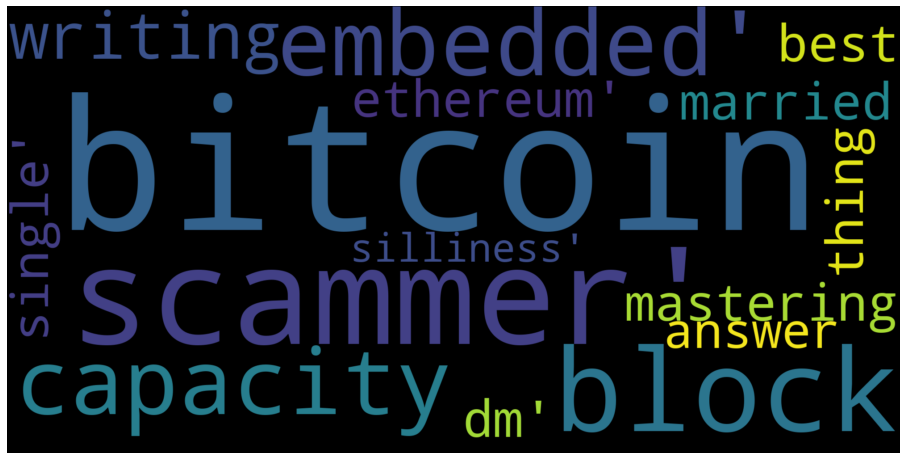

In [19]:
cleaned_wordcloud_generator(aantonop)

In [20]:
set_date(aantonop)

#creating the combined dataframe
aantonop_combined = aantonop.groupby(['tweet_day'])['cleaned_tweets'].apply(' ' .join).reset_index()

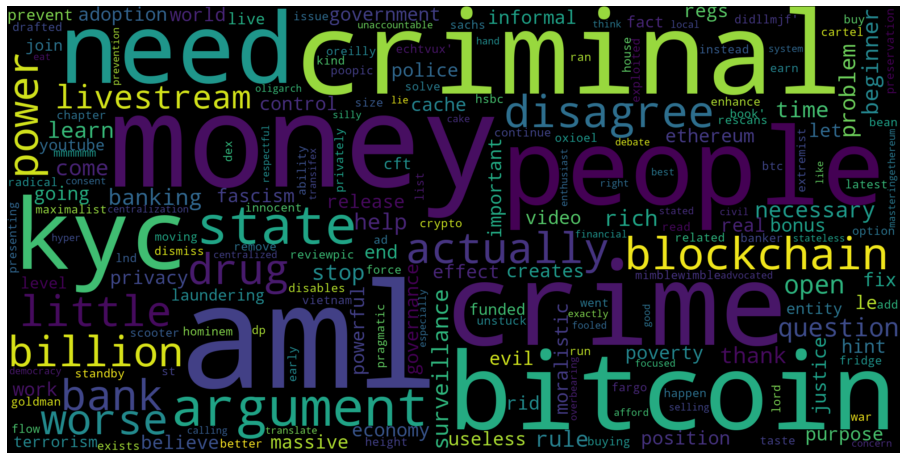

In [21]:
cleaned_wordcloud_generator(aantonop_combined)

The combined tweet word cloud looks more dense with a greater vocabulary and looks to capture the topics of the body of tweets better from the user. 

In [22]:
APompliano.drop_duplicates(subset='tweet_id', inplace=True)
top_retweets(APompliano)

,text,likes,retweets,timestamp
6188,"The smartest people I know:\n\n1. Admit they know very little\n2. Constantly seek more info\n3. Encourage intellectual debate\n4. Have strong opinions, loosely held\n5. Are comfortable being wrong...",35051,13833,2018-03-24 12:06:36
11263,"US student debt just hit $1.4 TRILLION.\n\n$1,400,000,000,000\n\nWe’re watching the government & banks steal a generation’s future right in front of our eyes.",14959,6088,2018-05-26 14:20:45
1940,New Zealand has become the first country to legalize bitcoin as a replacement for the country's sovereign currency on worker's paychecks.\n\nRetweet this tweet so every nation state sees what is p...,8248,4819,2019-08-13 14:40:28
12694,"Harvard just announced they’re charging the full $50k a year for 100% remote classes this coming year.\n\nMaybe kids should just listen to podcasts, watch YouTube, and read books instead.",30158,4717,2020-07-06 17:10:06
9656,Retweet if you think Bitcoin survives the bear market,6059,4689,2018-12-07 19:03:58
1498,Retweet if you think Bitcoin is the future,3577,3245,2019-08-26 23:47:40
2074,"I want everyone to learn about Bitcoin. \n\nBecause of that, I’m giving away 10 free subscriptions to the newsletter I write to institutional investors about the industry every morning.\n\nRetweet...",2167,3110,2019-08-11 11:53:57
910,BREAKING: Chinese President Xi Jinping just publicly supported China going all-in on blockchain technology across their economy.\n\nThis will be the space race of our generation.\n\nAmerica has to...,8819,2792,2019-10-25 11:41:24
775,Twitter needs a Bitcoin emoji.\n\nRetweet if you think @jack and team should make it happen!,5110,2717,2019-10-29 17:45:19
6622,"HERE WE GO.\n\nICE, owner of New York Stock Exchange, just announced a global platform to ""enable consumers and institutions to seamlessly buy, sell, store and spend digital assets.""\n\nThis may b...",6393,2486,2018-08-03 12:53:58


In [23]:
APompliano[['text']]

,text
0,This.https://twitter.com/jpmi1/status/908708955597230080 …
1,"There are few things more satisfying than returning to tell someone who didn't believe in you:\n\n""I did what I said I was going to do"""
2,I found this advice incredibly valuablepic.twitter.com/0X0WIFGYVm
3,I have learned the hard way to run from any argument that makes absolute claims. There is never ZERO risk of anything
4,I specifically was referring to every coin being down 14%+ on a single day. Agree that below $3k for BTC would be unlikely / worrisome
...,...
13949,Absolutely. Glad you enjoyed it.
13950,Glad you enjoyed it. Was very impressed with her and love her independent thinking
13951,
13952,"This conversation with @CaitlinLong_, a Wall Street insider for two decades, sheds a light on why Wall Street may not be Bitcoin's friend. \n\nPromise you will learn something if you listen:https:..."


In [24]:
cleaning_tweets(APompliano)

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.coindesk.com/information/ " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://cointelegraph.com/news/us-lawmakers-draft-bill-protecting-cryptocurrencies-from-gov-interference …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.cnbc.com/2017/08/14/david-sacks-cryptocurrency-interview.html …" looks lik

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://markets.businessinsider.com/news/stocks/new-zealand-legalizes-cryptocurrency-salaries-including-bitcoin-2019-8-1028442320 …pic.twitter.com/FFZZgH09Qy" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "http://www.reuters.com/article/us-foxconn-results-idUSKBN1721C1 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://cointelegraph.com/news/airasia-is-building-own-payment-platform-looking-into-launching-ico-says-ceo …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.businesswire.com/news/home/20180803005236/en/Intercontinental-Exchange-Announces-Bakkt-Global-Platform-Ecosystem …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarni

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "http://offthechainmerchandise.com " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "http://www.digitalassetindexfund.com " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.digitalassetindexfund.com/ " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get th

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.bloomberg.com/news/articles/2018-10-05/yale-is-said-to-invest-in-crypto-fund-that-raised-400-million …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "http://fortune.com/2018/10/01/reid-hoffman-blitzscaling-book/ …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/apompliano/status/104568577361233

0                                                                                                                            
1                                                                  thing satisfying returning tell someone believe said going
2                                                                               found advice incredibly valuablepic x wifgyvm
3                                                  learned hard way run argument make absolute claim never zero risk anything
4                                           specifically referring every coin single day agree k btc would unlikely worrisome
                                                                 ...                                                         
13949                                                                                                 absolutely glad enjoyed
13950                                                                        glad enjoyed impressed love independent t

In [25]:
APompliano[['cleaned_tweets']]

,cleaned_tweets
0,
1,thing satisfying returning tell someone believe said going
2,found advice incredibly valuablepic x wifgyvm
3,learned hard way run argument make absolute claim never zero risk anything
4,specifically referring every coin single day agree k btc would unlikely worrisome
...,...
13949,absolutely glad enjoyed
13950,glad enjoyed impressed love independent thinking
13951,
13952,conversation wall street insider two decade shed light wall street may bitcoin friend promise learn something listen


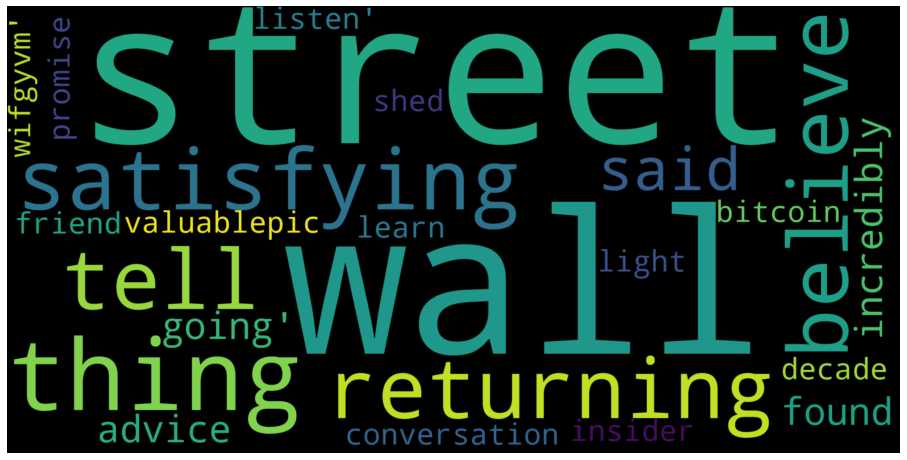

In [26]:
cleaned_wordcloud_generator(APompliano)

In [27]:
set_date(APompliano)

#creating the combined dataframe
APompliano_combined = APompliano.groupby(['tweet_day'])['cleaned_tweets'].apply(' ' .join).reset_index()

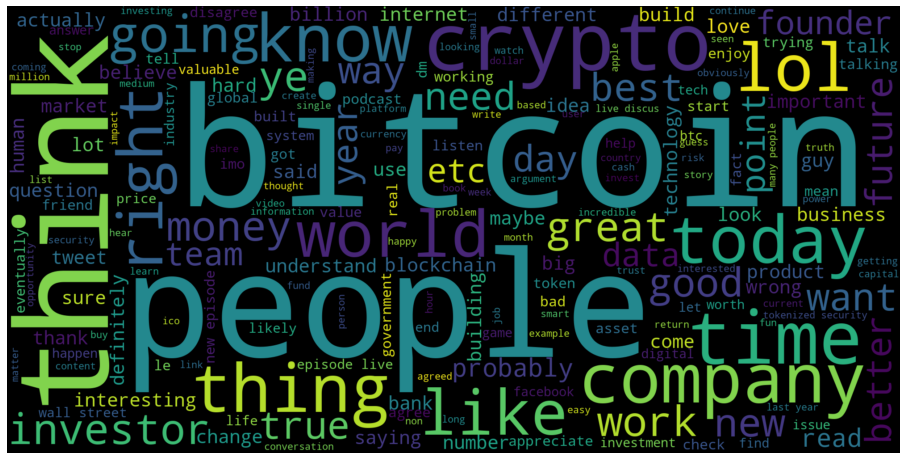

In [28]:
cleaned_wordcloud_generator(APompliano_combined)

In [29]:
brian_armstrong.drop_duplicates(subset='tweet_id', inplace=True)
top_retweets(brian_armstrong)

,text,likes,retweets,timestamp
296,"You have to be ok with people hating you to do anything interesting it turns out. Nobody mentioned that growing up.\n\nFigure out what you feel is right and go for it, regardless of what others th...",10795,2333,2020-05-13 03:00:09
59,"Achievement unlocked! I dreamt about a sitting U.S. president needing to respond to growing cryptocurrency usage years ago. ""First they ignore you, then they laugh at you, then they fight you, the...",6632,1878,2019-07-12 01:36:32
494,"""The world is changed by examples, not by opinions."" - Paulo Coelho",2820,758,2019-02-23 04:26:33
220,pic.twitter.com/uhz7Od3skX,3201,696,2020-04-16 22:01:10
425,"It's easy to bounce from one new idea to the next, exploring your intellectual curiosity. But having an impact requires a decade of moving the ball forward one yard every day, sometimes in a very ...",3047,695,2019-09-01 16:35:36
545,"Summarizing a recent conversation I had with friends comparing messages to payments, and what happens when technology drives down costs...",1988,671,2020-02-06 22:58:21
105,"1/ Today is a big day for Bitcoin, as it marks 10 years since the Genesis Block. Some people think I don’t like to talk about Bitcoin (), but today I have a few words to say",2970,655,2019-01-03 19:25:30
163,"Got this advice recently. Thought it was great, so passing along:\nImagine where you want to be in 5 years\nThen think through what that requires you to get done this year\nAnd then don’t spend an...",2811,626,2019-05-22 02:14:40
367,The race is on:https://www.theblockcrypto.com/post/44646/xi-jinping-says-to-let-china-take-the-leading-position-in-blockchain …,1975,586,2019-10-25 15:56:07
426,This is such a great headlinehttps://www.bloomberg.com/news/articles/2019-04-18/u-s-refused-his-visa-eight-times-now-zoom-ceo-is-a-billionaire …,2634,577,2019-04-19 06:14:01


In [30]:
brian_armstrong[['text']]

,text
0,Coinbase is rolling out 12 new things for 12 days of Christmas https://blog.coinbase.com/day-2-of-12-days-of-coinbase-empowering-venezuelan-families-with-givecrypto-f1def56a5c81 …\n\nStay tuned f...
1,Moar assets https://twitter.com/CoinbasePro/status/1071102175051304960 …
2,Wow this is a trip down memory lane - me demoing a payment feature I coded on UniversityTutor from almost 10 years ago https://vimeo.com/4051296
3,Digital Currency Could Be Widely Used In VRhttps://link.medium.com/ABCjERPGrS
4,Welcome Zcash!https://twitter.com/coinbase/status/1070380633824858112 …
...,...
562,The Coinbase Pro mobile app is now available on Android!https://twitter.com/CoinbasePro/status/1214604317656698880 …
563,"Well written \n\nWho knew, candid internal memos can work even better than PR scrubbed external memos!https://twitter.com/boztank/status/1214622030156328960 …"
564,"I feel like there will be many applications of people using these to create rent generating IoT devices via crypto. https://blog.arduino.cc/2020/01/07/arduino-goes-pro-at-ces-2020/ …\n\nCamera, ai..."
565,https://www.forbes.com/sites/brianbrooks/2020/01/07/three-cryptocurrency-regulation-themes-for-2020--and-the-flawed-premises-behind-them/#6f80c8a563e3 …


In [31]:
cleaning_tweets(brian_armstrong)

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/ConnieCurious/status/1068552690244800512 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/AsiffHirji/status/1068718087791239169 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://en.m.wikipedia.org/wiki/Interstellar_travel#Wait_calculation …
https://en.m.wikipedia.org/wiki/Breakt

0                                                                                              coinbase rolling new thing day christmas stay tuned tomorrow
1                                                                                                                                                moar asset
2                                                                        wow trip memory lane demoing payment feature coded universitytutor almost year ago
3                                                                                                                        digital currency could widely used
4                                                                                                                                             welcome zcash
                                                                               ...                                                                         
562                                                             

In [32]:
brian_armstrong[['cleaned_tweets']]

,cleaned_tweets
0,coinbase rolling new thing day christmas stay tuned tomorrow
1,moar asset
2,wow trip memory lane demoing payment feature coded universitytutor almost year ago
3,digital currency could widely used
4,welcome zcash
...,...
562,coinbase pro mobile app available android
563,well written knew candid internal memo work even better pr scrubbed external memo
564,feel like many application people using create rent generating iot device via crypto camera air quality sensor wifi hotspot etc cool example already
565,


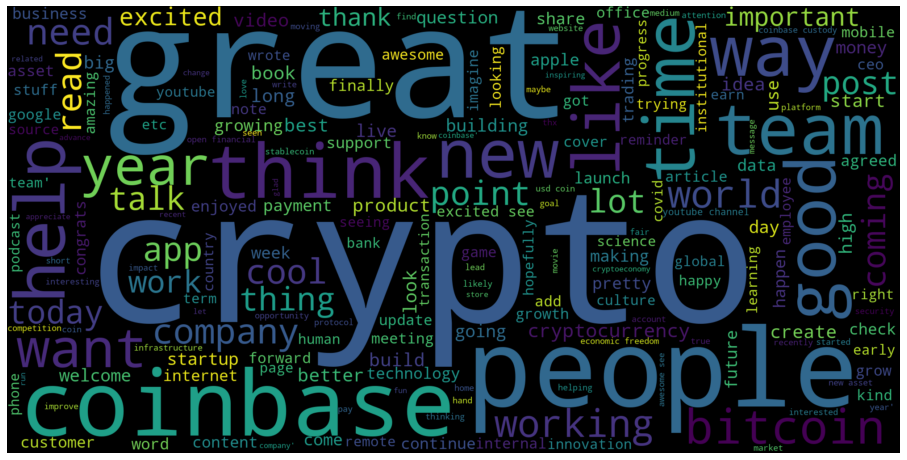

In [33]:
cleaned_wordcloud_generator(brian_armstrong)

In [34]:
set_date(brian_armstrong)

#creating the combined dataframe
brian_armstrong_combined = brian_armstrong.groupby(['tweet_day'])['cleaned_tweets'].apply(' ' .join).reset_index()

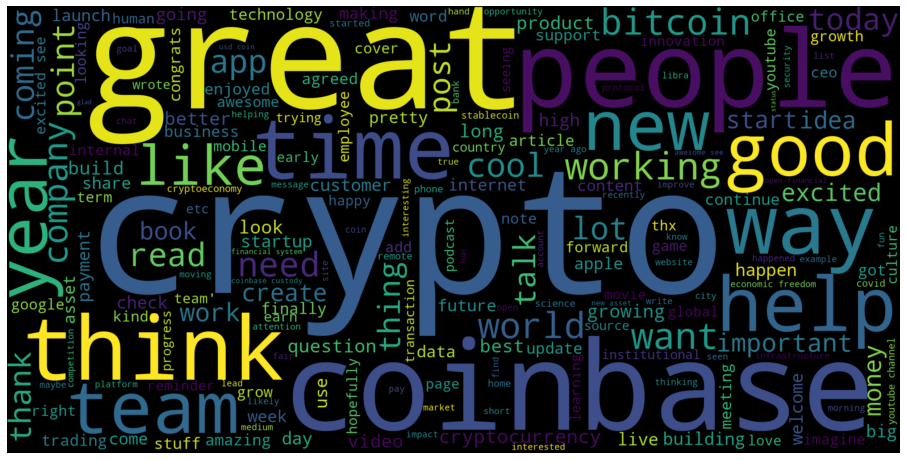

In [35]:
cleaned_wordcloud_generator(brian_armstrong_combined)

Coinbase CEO looks to be using his twitter profile to tweet about his company, a cryptocurrency exchange, and does not look to be adding much to the bitcoin public discourse. 

In [36]:
BitcoinMagazine.drop_duplicates(subset='tweet_id', inplace=True)
top_retweets(BitcoinMagazine)

,text,likes,retweets,timestamp
3339,Can you guess the price of Bitcoin at the Halving?\n\n@bitFlyerUSA is rewarding the 5 closest guesses with $125 in BTC \n\nHere is how to play\n1. Retweet this.\n2. Follow @bitFlyerUSA \n3. Guess ...,954,982,2020-05-08 22:11:26
4429,CoinMine One #Giveaway!\n\nWe're picking one lucky winner on 8/30 at 12 PM CST to receive @coinmine's plug-and-play GPU miners that helps you stack sats AND run a full #bitcoin + lightning node! h...,1111,904,2019-08-29 18:00:37
3004,An attack against one is an attack against all. #WeAreAllHodlonaut\n\nArtwork: @CryptoScamHubpic.twitter.com/EjIlwKnAmD,2550,689,2019-04-11 16:35:05
5416,Can you guess the #bitcoin price at the time of the halving?\n\n@Trezor is giving away a limited edition Trezor One Metallic ($543) to the person w/ the closest guess.\n\nHere is how to play:\n1 R...,505,604,2020-05-11 16:59:37
1709,"Happy Birthday, Bitcoin! \n\nThe first Bitcoin block was mined on January 3rd, 2009 12:15 PM CST.",1411,594,2019-01-03 06:16:23
3970,"Untraceable, physical cash is the best tool for facilitating drug trades and unlawful activities, not a public ledger that records the history of every transaction ever made.",5041,484,2019-07-12 00:26:26
411,This Bitcoin Developer Is About to Take on the Mining Hardware Industry https://bitcoinmagazine.com/articles/bitcoin-developer-about-take-mining-hardware-industry/ … #bitcoin #mining #dragonsden @...,744,475,2017-11-22 16:11:06
4497,Best of luck best to both sides!pic.twitter.com/HOofQvc2UE,1784,389,2019-06-18 23:49:32
3054,"#Bitcoin forks, visualized. \n\nhttps://bitcoinmagazine.com/articles/infographic-map-bitcoin-forks …pic.twitter.com/wqABMz9LW5",897,363,2019-04-08 15:25:15
2313,"Free #Bitcoin Alert \n\nThis Christmas, our awesome partners at @Give_Bitcoin are doing a #giveaway of 1M sats ($75) and their world class education! \nTo enter\n-Follow @Give_Bitcoin\n-RT this t...",363,362,2019-12-23 16:50:55


In [37]:
BitcoinMagazine[['text']]

,text
0,ICYMI: Latest Twist to the Block Size Debate Is Called a “UASF” https://bitcoinmagazine.com/articles/latest-twist-block-size-debate-called-uasf/ … #bitcoin #blockchainpic.twitter.com/T7FxvX825T
1,How Russia Plans to Boost Blockchain Development Now https://bitcoinmagazine.com/articles/how-russia-plans-boost-blockchain-development-now/ … #russia #blockchain #fintechpic.twitter.com/Q8mhQfBwnL
2,Japanese Banks Plan to Make Payments Using @Ripple Blockchain https://bitcoinmagazine.com/articles/japanese-banks-plan-make-payments-using-ripple-blockchain/ … #blockchain #fintech #bankingtechnol...
3,Blockchain in Financial Services Today: Where are We Now? Where Are We Heading? https://bitcoinmagazine.com/articles/blockchain-financial-services-today-where-are-we-heading/ … #blockchain #fintec...
4,Something Odd Is Happening at Bitcoin’s Largest #Mining Pool https://bitcoinmagazine.com/articles/something-odd-happening-bitcoins-largest-mining-pool/ … #bitcoin #blockchainpic.twitter.com/GfLZk4...
...,...
5470,Can you guess the (closest) time the first 6.25 #bitcoin block will be mined?\n@CoboVault is giving away two Cobo Vault Pros to the closest guesses\n\nHere is how to play:\n1. Retweet this\n2. Gue...
5471,Moon
5472,Only 49 minutes until we go live!!!! http://Bitcoinhalving.com pic.twitter.com/TY3uz8MXJN
5473,T-Minus 1 hour and 15 minutes until the http://BitcoinHalving.com 21-hour live stream. Ready to take the plunge? #bitcoin #halvingpic.twitter.com/LrEalnNZfb


In [38]:
cleaning_tweets(BitcoinMagazine)

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.amazon.com/End-Fed-Ron-Paul/dp/0446549193 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/TheBitcoinConf/status/1220006127636795392 …pic.twitter.com/3Z17slixGI" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "http://bitcoinmagazine.com/articles/bitcoin-startup-working-free-speech-alternatives-p

0                                                                                                  icymi latest twist block size debate called uasf bitcoin blockchainpic fxvx
1                                                                                             russia plan boost blockchain development russia blockchain fintechpic q mhqfbwnl
2                                                                      japanese bank plan make payment using blockchain blockchain fintech bankingtechnology japanpic oha nb f
3                                                                                          blockchain financial service today heading blockchain fintech finservpic qc gwkabzy
4                                                                                         something odd happening bitcoin largest mining pool bitcoin blockchainpic gflzk fh e
                                                                                         ...                                 

In [39]:
BitcoinMagazine[['cleaned_tweets']]

,cleaned_tweets
0,icymi latest twist block size debate called uasf bitcoin blockchainpic fxvx
1,russia plan boost blockchain development russia blockchain fintechpic q mhqfbwnl
2,japanese bank plan make payment using blockchain blockchain fintech bankingtechnology japanpic oha nb f
3,blockchain financial service today heading blockchain fintech finservpic qc gwkabzy
4,something odd happening bitcoin largest mining pool bitcoin blockchainpic gflzk fh e
...,...
5470,guess closest time first bitcoin block mined giving away two cobo vault pro closest guess play retweet guess block mined utc follow picking winner may thpic beq yxiqy
5471,moon
5472,minute go live ty uz mxjn
5473,minus hour minute hour live stream ready take plunge bitcoin halvingpic lrealnnzfb


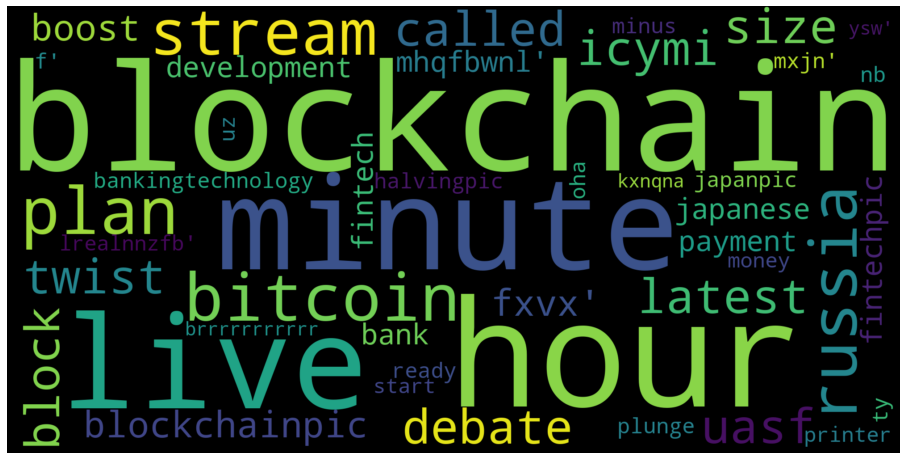

In [40]:
cleaned_wordcloud_generator(BitcoinMagazine)

In [41]:
set_date(BitcoinMagazine)

#creating the combined dataframe
BitcoinMagazine_combined = BitcoinMagazine.groupby(['tweet_day'])['cleaned_tweets'].apply(' ' .join).reset_index()

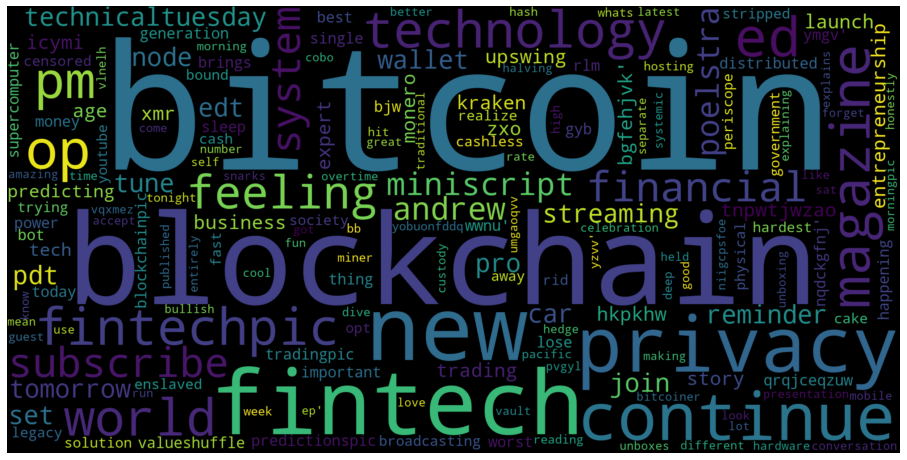

In [42]:
cleaned_wordcloud_generator(BitcoinMagazine_combined)

In [43]:
CoinDesk.drop_duplicates(subset='tweet_id', inplace=True)
top_retweets(CoinDesk)

,text,likes,retweets,timestamp
1868,"SCOOP: Fintech giant @PayPal plans to offer direct sales of cryptocurrency to its 325 million users, according to three people familiar with the matter.\n\n@IanAllison123 reportshttps://www.coinde...",5865,2528,2020-06-22 17:01:09
8835,BREAKING: @Microsoft is launching the first decentralized infrastructure implementation by a major tech company to be built directly on the bitcoin blockchain. Report by @La__Cuenhttp://ow.ly/aZ6c...,4251,2018,2019-05-13 13:00:38
2875,"BREAKING: In his first major comments on blockchain, Chinese President Xi Jinping said the country should implement the technology across the economy, reports @wsfoxley.http://ow.ly/69Af50wTL54",3577,1702,2019-10-25 11:13:24
180,JUST IN: @coinbase has launched a @Visa debit card allowing U.K. and EU users to spend crypto directly from their exchange accounts.http://ow.ly/sAAQ50pMx23,4292,1685,2019-04-10 23:05:05
2208,"BREAKING: BitConnect says it is shutting down its lending and exchange site, citing cease-and-desist letters, ""bad press"" and denial-of-service attacks http://bit.ly/2rdeFPo",1905,1377,2018-01-16 21:03:22
2263,KFC Canada Is Accepting Bitcoin for Fried Chicken http://bit.ly/2DlFOC3 pic.twitter.com/qIw9ccjSGd,2792,1370,2018-01-12 03:17:24
13209,"Google has revealed that it will begin allowing advertisements for ""regulated"" crypto exchanges beginning next month.http://ow.ly/8Par30lXXLg",2413,1233,2018-09-25 15:52:44
11849,JUST IN: @binance now lets users purchase cryptos using Visa and Mastercard credit.http://ow.ly/igDj30nwB84,2973,1138,2019-01-31 12:01:50
10716,"BREAKING: SEC Commissioner @HesterPeirce has unveiled her proposal to create a safe harbor for crypto startups, allowing them three years to build out their networks before having to address feder...",3102,1135,2020-02-06 16:00:58
2866,JUST IN: China's Congress passed a cryptography law on Saturday that could further the country's ramped-up blockchain ambitions. http://ow.ly/4sSD50wUw85 @jp4874 reports,2295,1078,2019-10-26 14:26:10


In [44]:
CoinDesk[['text']]

,text
0,We're excited to announce our sponsor @TradeBlock will be at #Consensus2019. Register now: http://ow.ly/n8z630ocktr pic.twitter.com/XyYjTCHjZh
1,We're happy to welcome @matthewde_silva to speak at #Consensus2019. Register now: http://ow.ly/c5u250qjVaK pic.twitter.com/LbFYhLzdry
2,"One of the most popular cryptocurrencies for privacy protection, monero, celebrated five years of existence this week. CoinDesk looks at some of the project's most significant upgrades during that..."
3,"On #FollowFriday, we'd like to thank some of our sponsors: @PermissionIO @klaytn_official @thecryptovalley @ConsenSys @CooleyLLP @CushWake @ConfluxChain @dexonfoundation @DLA_Piper @friedmanllp @W..."
4,"SUBSCRIBE to ""Road to Consensus"" wherever you get your podcasts. \n\nLISTEN to the latest episode with @episcini: Supply Chains and Marketplace Participation.pic.twitter.com/efYI1wCxzf"
...,...
13551,Subscribe to our new #newsletter: Institutional #Crypto. It's a weekly digest of the most important #news and analysis specifically for institutional investors. http://ow.ly/CR8B30lM731 pic.twitte...
13552,"EXCLUSIVE: In the latest good news for the crypto project, TokenSoft says it is launching support for token sales built on the Stellar network.http://ow.ly/y7mJ30lM4iV"
13553,FINRA FIRST: The Financial Industry Regulatory Authority has filed a securities fraud complaint against a cryptocurrency broker.http://ow.ly/Rj9Q30lM2XL
13554,Blockchain startups Ripple and R3 have resolved a legal battle that saw both firms filing suits in the U.S. over a contract dispute.http://ow.ly/nI1u30lLZTx


In [45]:
cleaning_tweets(CoinDesk)

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/nikhileshde/status/1271133619130638341 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/naval/status/970882742924623872 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/twobitidiot/status/908503925959151616 …" looks like a URL. Beautiful Soup is not an HTTP client. 

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/Ripple/status/1024324583963250688 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/jihanwu/status/929436089172889600 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "http://bit.ly/2zKRBYo " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client l

0                                                                                                         excited announce sponsor consensus register xyyjtchjzh
1                                                                                                        happy welcome silva speak consensus register lbfyhlzdry
2        one popular cryptocurrencies privacy protection monero celebrated five year existence week coindesk look project significant upgrade period dkim report
3                                                                                followfriday like thank sponsor official piper network c group ffpic gcqkzybbjl
4                                         subscribe road consensus wherever get podcasts listen latest episode supply chain marketplace participation efyi wcxzf
                                                                                  ...                                                                           
13551                            s

In [46]:
CoinDesk[['cleaned_tweets']]

,cleaned_tweets
0,excited announce sponsor consensus register xyyjtchjzh
1,happy welcome silva speak consensus register lbfyhlzdry
2,one popular cryptocurrencies privacy protection monero celebrated five year existence week coindesk look project significant upgrade period dkim report
3,followfriday like thank sponsor official piper network c group ffpic gcqkzybbjl
4,subscribe road consensus wherever get podcasts listen latest episode supply chain marketplace participation efyi wcxzf
...,...
13551,subscribe new newsletter institutional crypto weekly digest important news analysis specifically institutional investor iuc nzh
13552,exclusive latest good news crypto project tokensoft say launching support token sale built stellar network
13553,finra first financial industry regulatory authority filed security fraud complaint cryptocurrency broker
13554,blockchain startup ripple r resolved legal battle saw firm filing suit u contract dispute


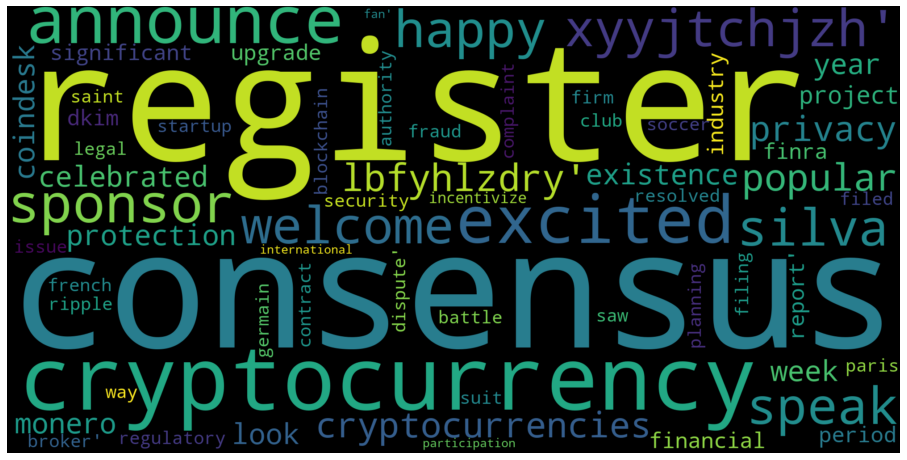

In [47]:
cleaned_wordcloud_generator(CoinDesk)

In [48]:
set_date(CoinDesk)

#creating the combined dataframe
CoinDesk_combined = CoinDesk.groupby(['tweet_day'])['cleaned_tweets'].apply(' ' .join).reset_index()

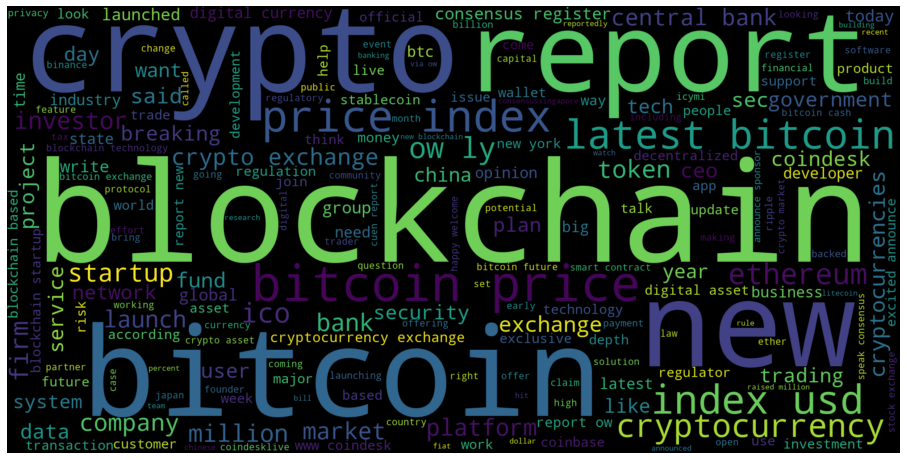

In [49]:
cleaned_wordcloud_generator(CoinDesk_combined)

In [50]:
CoinDesk_combined.head()

,tweet_day,cleaned_tweets
0,2017-02-06,latest bitcoin price index usd zmtr qe illinois village move sell confiscated bitcoins wkytaoag coindesk investigates roger ver passionate sometimes divisive advocacy bigger bitcoin block coindesk...
1,2017-02-07,latest bitcoin price index usd zaxaxc r forbes venezuela currency crisis case study bitcoin via bitcoin volatility tightens price surge month high lpfu cuxxb harvard business review truth blockcha...
2,2017-02-08,latest bitcoin price index usd kja mtwvy bet bitcoin whether winklevoss etf go live c g w adsn gulf time islamic finance digital currency halal aspect news chinese trader suing cryptocurrency exch...
3,2017-02-09,latest bitcoin price index usd jjl wp pfj bitmex launched prediction market would let trader bet approval proposed winklevoss etf china fear spread beyond bitcoin crypto market slide hblbogwanr hu...
4,2017-02-10,latest bitcoin price index usd mk xwbxcrr russian fintech consortium appointed qiwi chief sergey solonin new got coding chop dark market offered bug bounty latest bitcoin price index usd rlno ljey...


In [51]:
CryptoDonAlt.drop_duplicates(subset='tweet_id', inplace=True)
top_retweets(CryptoDonAlt)

,text,likes,retweets,timestamp
10671,What I think will happen:\n\n1) BTC pumps to ~9-11k\n2) Alts start rallying close to the top\n3) BTC starts dropping while alts do really well\n4) BTC dumps hard\n5) Alts dump hard\n6) Everyone c...,3488,669,2018-07-24 16:55:38
3389,"""Bitcoin is always going down""\n\nHere is some perspective in the form of a yearly chart for you folks.pic.twitter.com/1XB5UZyPyD",2156,447,2019-04-18 11:20:41
4796,"People out here talking about ""final capitulation"" while we almost went to zero due to cascading liquidations overnight.\n\nIf there ever was a final capitulation yesterday was it.\nThe ballsy fuc...",3852,425,2020-03-13 14:19:40
8144,The next big move will be so incredibly obvious in hindsight.\n\nBulls have:\n\n1) BAKKT coming\n2) Increased legislative & institutional interest\n3) Lows holding strong\n\nBears have:\n\nI) Weak...,1675,353,2018-10-05 00:42:41
3028,If you're stuck in a 9-5 go nowhere dead-end job\n\nTry crypto!\n\nYou'll be stuck in front of the computer from 9-9 instead.,3795,311,2020-01-29 13:30:56
10229,The moment we approach the 6000 resistance:\n\n-Bitfinex gets sued\n-Tether FUD\n-Binance gets hacked and funds not #SAFU\n\nCoincidence?,2083,305,2019-05-07 23:48:06
8190,$BTC quarterly update:\n\nRelatively promising close.\nThe last few times we've gotten two quarterly close in such a tiny range was at the end of both bear markets.\nI don't really trade based on ...,1177,286,2018-10-01 00:28:50
8993,Watch it happen againpic.twitter.com/viTvON9jyE,1492,278,2018-08-12 14:33:38
8656,A simple guide on alt pumps\n\n1) Don't FOMO into coins that already pumped\n2) Look for coins that did pump\n3) Check their chart history (How they looked before they pumped)\n4) Buy the ones tha...,1363,273,2018-08-27 23:00:11
897,$BTC\n\nI'm pretty sure we're gonna bounce big time in the next 3-6 months.pic.twitter.com/gfwhjLyJR1,1972,261,2020-01-01 02:12:10


In [52]:
CryptoDonAlt[['text']]

,text
0,@Cryptonoobie \nWhat dou you think about this $WAVES pattern?\nhttps://www.coinigy.com/s/i/59b54ef25bc48/ …\nReliable enough to get into?
2,Well it's standing it's ground while Bitcoin does its thing. That's a really good sign in my opinion!
3,$Eth breakout while Bitcoin is going up. A really good indicator for what's about to come in the next weeks.
4,"A lot of people got stuck from 0.15 to 0.08 in $ETH\nMan its so sad\n\nObviously people get stuck in shit that's how trading works, someone wins someone loses..."
5,Indeed this is fucking nuts... I have no idea where to take profits and when..
...,...
12613,"That doesn't look anything alike, market structure is completely different this time."
12614,"Yes, too weak to indicate trend reversal for me but we'll see."
12615,"$BTC monthly, weekly and daily update:\n\nMonthly:\n\n-Turning neutral\n-Supported by 8EMA and 0.618 Fib\n\nWeekly:\n\n-Very bearish\n-Barely managed to close above 0.618 Fib\n-Next support below ..."
12616,TA learning material?https://twitter.com/CryptoDonAlt/status/961717191975501825 …


In [53]:
cleaning_tweets(CryptoDonAlt)

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.babypips.com/learn/forex/divergence-cheat-sheet …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/CryptoDonAlt/status/1142486426854072321?s=20 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.reddit.com/r/ihavesex/ " looks like a URL. Beautiful Soup is not an HTTP client. You should

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.youtube.com/watch?v=6htT-aVJup4 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://youtu.be/ExWLn86Mu_g?t=6 " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://discord.gg/fXjyyy " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the docu

0                                                                                                                                                          dou think wave pattern reliable enough get
2                                                                                                                                         well standing ground bitcoin thing really good sign opinion
3                                                                                                                                     eth breakout bitcoin going really good indicator come next week
4                                                                                             lot people got stuck eth man sad obviously people get stuck shit trading work someone win someone loses
5                                                                                                                                                                 indeed fucking nut idea take profit
          

In [54]:
CryptoDonAlt[['cleaned_tweets']]

,cleaned_tweets
0,dou think wave pattern reliable enough get
2,well standing ground bitcoin thing really good sign opinion
3,eth breakout bitcoin going really good indicator come next week
4,lot people got stuck eth man sad obviously people get stuck shit trading work someone win someone loses
5,indeed fucking nut idea take profit
...,...
12613,look anything alike market structure completely different time
12614,yes weak indicate trend reversal see
12615,btc monthly weekly daily update monthly turning neutral supported ema fib weekly bearish barely managed close fib next support k daily bearish lot resistance hoping higher lowpic zeukq cfg
12616,ta learning material


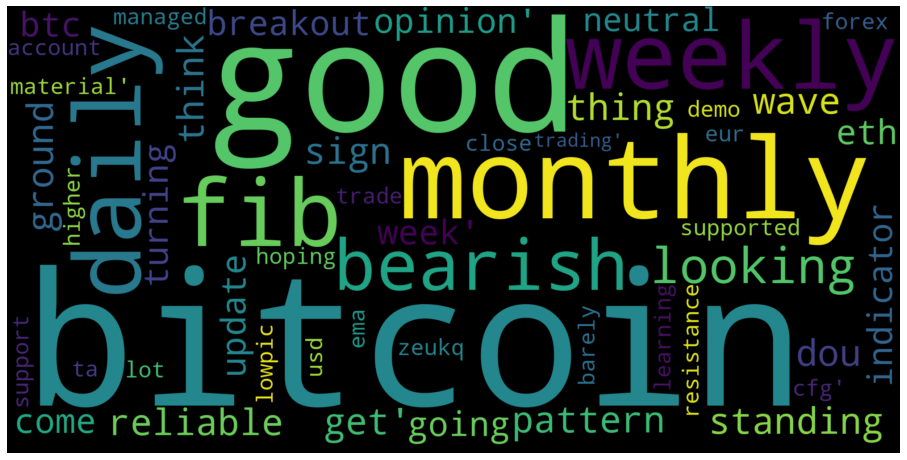

In [55]:
cleaned_wordcloud_generator(CryptoDonAlt)

In [56]:
set_date(CryptoDonAlt)

#creating the combined dataframe
CryptoDonAlt_combined = CryptoDonAlt.groupby(['tweet_day'])['cleaned_tweets'].apply(' ' .join).reset_index()

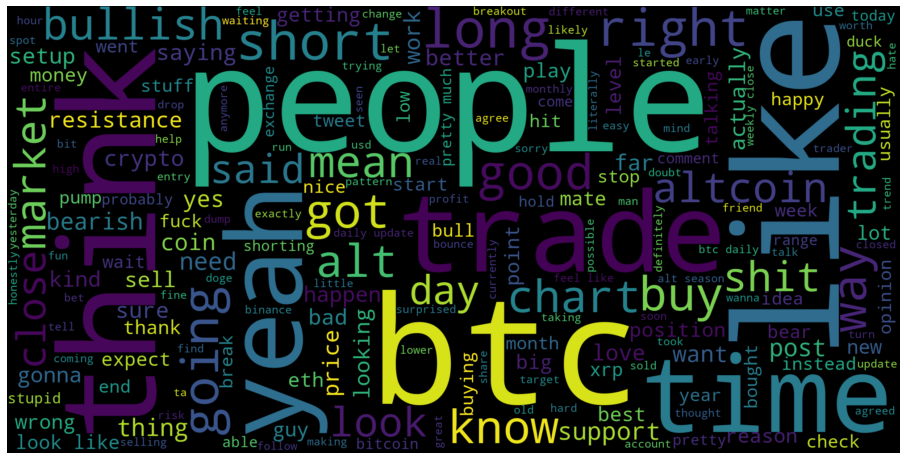

In [57]:
cleaned_wordcloud_generator(CryptoDonAlt_combined)

In [58]:
cz_binance.drop_duplicates(subset='tweet_id', inplace=True)
top_retweets(cz_binance)

,text,likes,retweets,timestamp
3935,"Craig Wright is not Satoshi.\n\nAnymore of this sh!t, we delist!https://twitter.com/BitcoinMagazine/status/1116379149998940161 …",14807,3848,2019-04-12 04:45:46
3010,"Facebook Libra coin don't need KYC. They have so much more data on the 2 billion people. Not just name, id, address, phone number. They know your family, friends, real-time/historic location, what...",10954,3570,2019-06-18 09:30:05
2814,We will be adding a couple trading pairs with XRP as the quote currency shortly. \n\nAnd rename ETH markets to ALTS market. Running out of space on the UI. \n\nMerry Xmas!,9308,3223,2018-12-24 04:56:02
71,Bitcoin price history.pic.twitter.com/sC3zCcp379,6619,2872,2018-03-31 02:01:42
1316,"The xrp base shill is strong. Let's get it out of your system, and put all your shills under this one tweet, and let's see how much we get. \n\nhttps://www.linkedin.com/pulse/binance-listing-tips-...",6998,2752,2018-11-18 06:38:27
6,"Nikkei showed irresponsible journalism. We are in constructive dialogs with Japan FSA, and have not received any mandates. It does not make sense for JFSA to tell a newspaper before telling us, wh...",5754,2327,2018-03-22 11:33:32
919,Now #France!\n\n#korea 2 days ago.\n#India 3 days ago.\n\nThe world is turning.https://u.today/bitcoin-btc-now-qualified-as-legal-form-of-money-by-french-authorities …,6450,2161,2020-03-07 09:26:29
2166,"Bitcoin rallies, ""damn, I wish I bought in earlier""\n\nA dip, ""omg, it's all crushing to 0, let me get out. ""\n\nRallies again. ""damn, i wish I bought that dip""\n\nA dip, ""omg, it's crushing agai...",8798,1680,2019-06-27 13:29:08
255,"Your shilling time. Which coins/tokens should @binance list? AND why?\n\nThis tweet is an exception to the ""no need to shill us"" guideline.",4537,1616,2020-06-28 16:13:20
110,"Our hearts go out to the victims in West Japan. @binance will begin with a $1,000,000 USD equivalent donation in either BNB, BTC, or JPY. We also ask our crypto partners to join us and help our f...",4516,1443,2018-07-08 00:21:41


In [59]:
cz_binance[['text']]

,text
0,"$40,000,000 USD, gone!https://www.linkedin.com/pulse/binance-q2-changpeng-zhao/ …"
2,Justin knows where the party is. Welcome to Malta $tron.https://twitter.com/justinsuntron/status/978162514704896001 …
3,Welcome to Malta! Now it’s a party.https://twitter.com/kris_hk/status/978147750905655296 …
4,"Honored, sir! Part of my original quote to Bloomberg that was left out of the article. ""Malta is very progressive when it comes to crypto and fintech. We think it is a good place for other crypt..."
5,No need to worry. Some negative news often turn out to be positive in the long term. Chinese have a proverb for this. New (often better) opportunities always emerge during times of change.
...,...
5127,
5128,just so much that could be done!
5129,I fully agree with this one. :)
5130,"I still don't know how to use Instagram, tbh. 1 Coming from twitter, No ""repost"" kills me. 2 I often don't have an image to post. 3 my lifestyle is boring, to the extreme for most people. But will..."


In [60]:
cleaning_tweets(cz_binance)

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://lovinmalta.com/news/crypto-trading-giant-binance-strikes-its-first-deal-in-malta …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/binance/status/1282905442801250306 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/whale_alert/status/1277582415154872323 …" looks like a URL. Beau

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://comparic.pl/binance-wchodzi-na-rynki-europejskie/ …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.cryptoqueen.pl/blog/binance-wystartowa%C5%82a-z-now%C4%85-kryptogie%C5%82d%C4%85-na-wyspie-jersey …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://finance.yahoo.com/news/crypto-exchange-binance-enter

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.coingecko.com/en/exchanges " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.theblockcrypto.com/2019/02/06/analysis-binance-brought-in-446-million-in-profits-in-2018-despite-the-bear-market/ …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.binance.vision/glossary/secure-asset-fund-for-users 

0                                                                                                                                      usd gone
2                                                                                                          justin know party welcome malta tron
3                                                                                                                           welcome malta party
4       honored sir part original quote bloomberg left article malta progressive come crypto fintech think good place crypto business look well
5                 need worry negative news often turn positive long term chinese proverb new often better opportunity always emerge time change
                                                                         ...                                                                   
5127                                                                                                                                    

In [61]:
cz_binance[['cleaned_tweets']]

,cleaned_tweets
0,usd gone
2,justin know party welcome malta tron
3,welcome malta party
4,honored sir part original quote bloomberg left article malta progressive come crypto fintech think good place crypto business look well
5,need worry negative news often turn positive long term chinese proverb new often better opportunity always emerge time change
...,...
5127,
5128,much could done
5129,fully agree one
5130,still know use instagram tbh coming repost kill often image post lifestyle boring extreme people learn hopefully bore people sleep lol


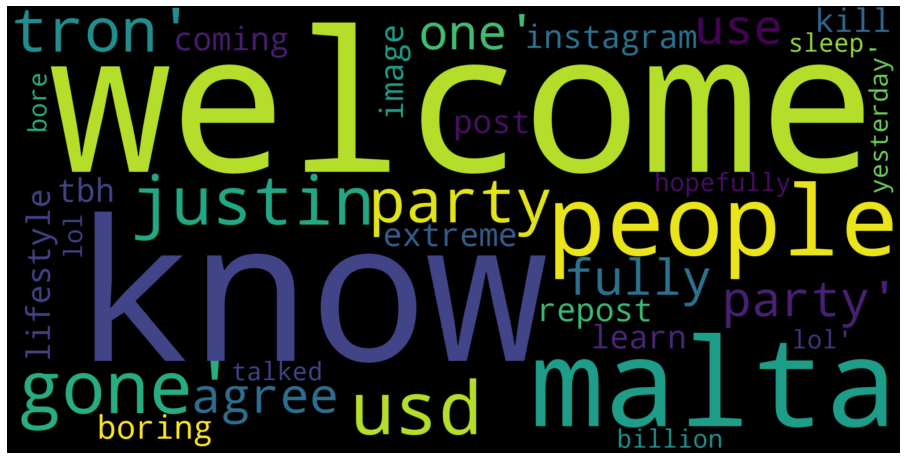

In [62]:
cleaned_wordcloud_generator(cz_binance)

In [63]:
set_date(cz_binance)

#creating the combined dataframe
cz_binance_combined = cz_binance.groupby(['tweet_day'])['cleaned_tweets'].apply(' ' .join).reset_index()

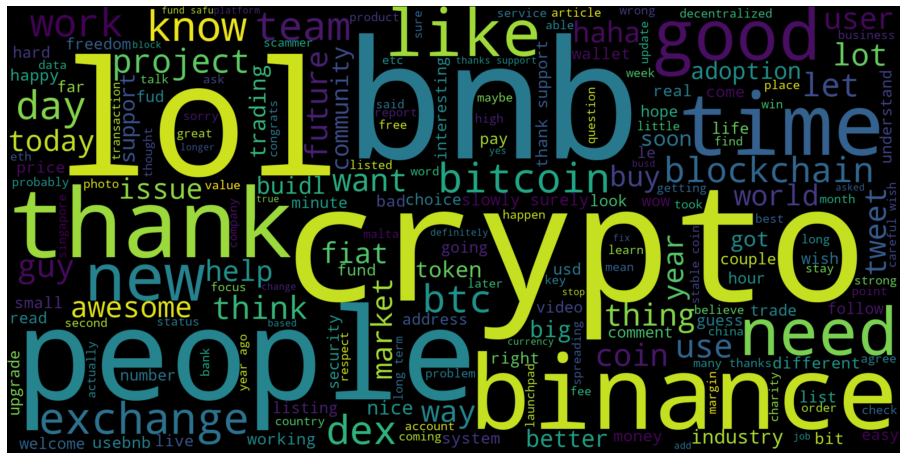

In [64]:
cleaned_wordcloud_generator(cz_binance_combined)

CZ is CEO of Binance, another cryptocurrency exchange, and it looks like he uses his twitter profile to engage in short discussions with cryptocurrency people. BNB is Binance's native coin offering and it looks like he uses this platform to promote it quite a bit. 

In [65]:
jimmysong.drop_duplicates(subset='tweet_id', inplace=True)
top_retweets(jimmysong)

,text,likes,retweets,timestamp
3721,"Stuff CS departments should teach, but don't do very well:\n\n* Source control, esp. git\n* How to do effective code review\n* How to read API documentation\n* Publishing your own library\n* Comma...",4010,1222,2018-04-21 12:01:02
144,You've been lied to all your life\n\nYour college is a reeducation camp\nYour food is poison\nYour money inflates at 6.75%/yr\nYour news is propaganda\nYour white collar job doesn't add value like...,3238,822,2019-07-13 14:49:25
2468,"Bitcoin doesn't care if you have a PhD in economics, a tenured faculty position, have billions under management or started 5 companies. Companies don't control bitcoin, neither do academics, VCs o...",2863,813,2018-07-05 22:38:52
3467,"In Bitcoin, I'm thankful for:\n\n1. The developers who strengthen the software\n2. The hodlers who amplify the store of value property\n3. The community who protect the network through shared valu...",2956,800,2017-11-24 02:48:19
3817,I just published “Why Bitcoin is Different”https://medium.com/p/why-bitcoin-is-different-e17b813fd947 …,1916,792,2018-04-02 12:02:38
2289,Why you don't want a blockchain -\n\n1. Storage: Everyone has to store everything\n2. Bandwidth: Everything has to be broadcast to everyone\n3. CPU: Everyone has to validate everything\n4. Develop...,2211,762,2018-02-15 16:18:36
3282,"""Career"" is a euphemism for wage slavery. It's not something to aspire to, it's something to escape.",2052,689,2017-12-20 23:33:55
2836,"The question I hope everyone will soon ask:\n\nIf the government can just print money, why do we pay taxes at all?\n\nGoing down that rabbit hole will eventually lead them to #Bitcoin",2682,652,2020-03-17 16:04:46
2508,Bear markets are great because we get rid of those that don't understand the tech and were just gambling. I hold because I believe in the technology and the economics. Go away until you have some ...,2730,649,2018-06-23 03:26:43
1729,"You've been deceived.\n\nYour food is poisonous, not nutritious.\nYour news is mind-numbing, not enlightening.\nYour job is soul-sucking, not fulfilling.\nYour money is value-bleeding, not value-s...",2452,623,2019-06-07 06:51:29


In [66]:
jimmysong[['text']]

,text
0,"Level is now starting a referral program. It's an innovative program that essentially will let you trade on their platform for free, or even earn money every month by referring others. Sign up wit..."
1,Money is not an opinion.
2,"Bitcoin, not Blockchain.\nStore of Value, not Payments.\nSelf-Sovereignty, not Convenience."
3,"Sunday Survey:\n\nHow much time do you spend on your investments per month? (include research, moving money around, etc)"
4,"You won't change Bitcoin. But Bitcoin will change you.\nThe same goes for altcoins, just not in a good way."
...,...
6492,"Tempted to actually buy mining equipment again. If there's an arms race, this is great for people who own miners.https://twitter.com/rogerkver/status/838922395545034752 …"
6493,@lopp Can you add a distribution of all utxos by value on http://statoshi.info ? I want to see % of utxos below certain value.
6494,"Looking for UTXO statistics. The marginal cost of adding a utxo to a tx is 36,000 satoshi at 200 satoshi/byte. How many are below 36k?"
6495,"I see doing neither as a likely, viable reality: https://medium.com/@jimmysong/bitcoin-realism-or-how-i-learned-to-stop-worrying-and-love-1mb-blocks-c191c35e74cb …"


In [67]:
cleaning_tweets(jimmysong)

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "http://github.com/jimmysong/programmingbitcoin …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "http://programmingblockchain.com " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "http://ProgrammingBlockchain.com " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to ge

0       level starting referral program innovative program essentially let trade platform free even earn money every month referring others sign referral code
1                                                                                                                                                money opinion
2                                                                                          bitcoin blockchain store value payment self sovereignty convenience
3                                                                  sunday survey much time spend investment per month include research moving money around etc
4                                                                                                           change bitcoin bitcoin change go altcoins good way
                                                                                 ...                                                                          
6492                                          

In [68]:
jimmysong[['cleaned_tweets']]

,cleaned_tweets
0,level starting referral program innovative program essentially let trade platform free even earn money every month referring others sign referral code
1,money opinion
2,bitcoin blockchain store value payment self sovereignty convenience
3,sunday survey much time spend investment per month include research moving money around etc
4,change bitcoin bitcoin change go altcoins good way
...,...
6492,tempted actually buy mining equipment arm race great people miner
6493,add distribution utxos value want see utxos certain value
6494,looking utxo statistic marginal cost adding utxo tx satoshi satoshi byte many k
6495,see neither likely viable reality


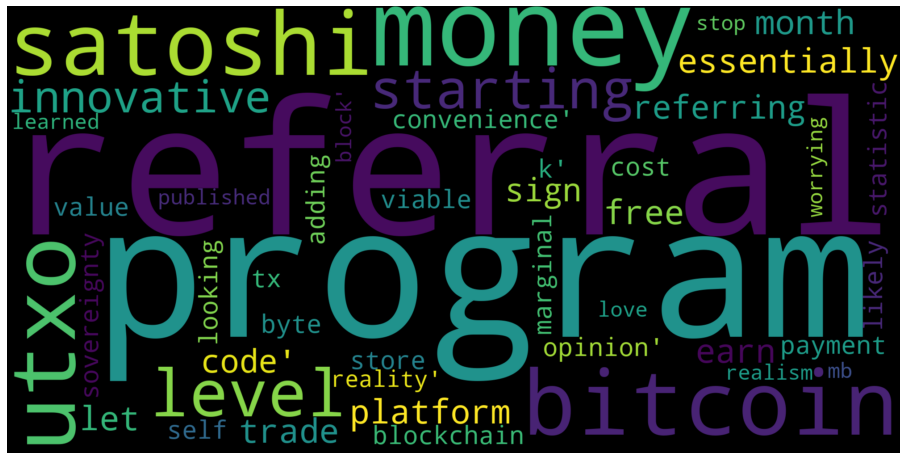

In [69]:
cleaned_wordcloud_generator(jimmysong)

In [70]:
set_date(jimmysong)

#creating the combined dataframe
jimmysong_combined = jimmysong.groupby(['tweet_day'])['cleaned_tweets'].apply(' ' .join).reset_index()

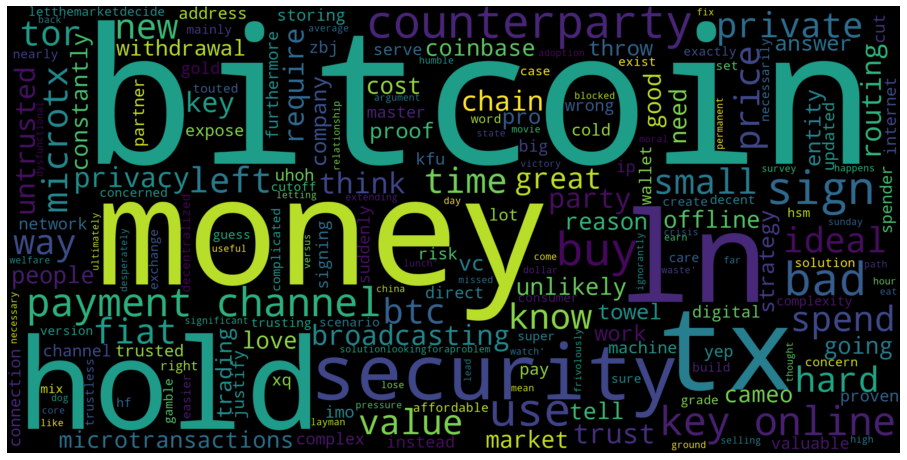

In [71]:
cleaned_wordcloud_generator(jimmysong_combined)

Jimmy Song describes himself as a bitcoin educator and it shows in his varied word cloud, from the number of rows in his combined daily tweet dataframe, it looks like he has been quite consistent in tweeting at least once a day. 

In [72]:
lopp.drop_duplicates(subset='tweet_id', inplace=True)
top_retweets(lopp)

,text,likes,retweets,timestamp
9989,"Welcome to Bitcoin, newcomers! Here's your FAQ:\n\nQ: Who should I trust?\nA: Nobody.\n\nQ: When should I sell?\nA: Never.\n\nQ: Is Bitcoin dying because ____?\nA: No.\n\nQ: What have I gotten mys...",12962,5080,2017-11-19 20:52:33
2735,"The final Bitcoin block with a subsidy of 12.5 BTC was mined by @f2pool_official and contained the following message in its coinbase transaction:\n\nNYTimes 09/Apr/2020 With $2.3T Injection, Fed's...",9982,4582,2020-05-11 19:31:14
914,"Bitcoin isn't a get rich quick scheme, it's a don't get poor slowly scheme.",7368,1744,2019-09-11 18:04:56
9619,"Try to move $100M of BTC: click a few buttons, wait a few blocks, and you're done.\nTry to move $100K of USD: click a few buttons, wait a few days, get interrogated & treated like a criminal, get ...",4365,1350,2017-12-24 09:02:09
3186,"Bitcoin is an adversarial network; by my count there were 68 attempts in the past week to feed an invalid block to my node. There was also an attempt to create 234,512 BTC out of thin air. This is...",4153,1337,2018-06-20 11:44:20
2842,Bitcoin doesn't need institutional investors. Institutional investors need Bitcoin.,4193,1168,2018-07-26 22:54:49
9376,I regret to inform you that the reputation of the @Bitcoin Twitter account is now questionable. Appears it was sold to help drive traffic to bitcoin(dot)com and will likely be ramping up to full b...,2399,1036,2018-01-07 21:12:54
1470,/r/bitcoin is a BTC subreddit\n/r/btc is a BCH subreddit\n@bitcoin is a BCH twitter\n@btc is a BTC twitter\nhttp://bitcoin.com is a BCH site\nhttp://bitcoin.org is a BTC site\nBitcoin Core is a ...,2390,1009,2018-05-27 14:27:09
2119,"Bitcoin's primary function is not ""store of value"" - that's a result of its primary function.\nBitcoin is ""fuck you money.""\n\nFor example:\nYou want to seize my accounts? Fuck you.\nYou don't wan...",3809,966,2019-11-24 15:37:29
358,"Libra sounds fairly well designed as a permissioned system, but it is facing quite a few long-term challenges. Oh, and it's not a blockchain.https://medium.com/@lopp/thoughts-on-libra-blockchain-4...",2300,921,2019-06-18 10:58:56


In [73]:
lopp[['text']]

,text
0,"Your profile states ""do your own research"" and that's what I've done. I don't care about what BSV does."
1,"The game of coins has dangers such as wizards, trolls, and dragons - only play with the pieces you can afford to lose.pic.twitter.com/zTpnlVaGff"
2,The source of the image will be linked in my article.
3,"The original is a nearly 30 year old polaroid and as such, it was faded. The only alteration I performed was brightening it up a bit to make it easier to see."
4,Reputation vs reputation works for me. Let's revisit this next week when I reveal the source of the photo.
...,...
11849,Are you suggesting that all 1.4 billion Chinese are perfectly compliant law-abiding citizens?
11850,Likelihood of China being able to permanently partition the Bitcoin network via the national firewall is close to 0. Only 1 bridge required.
11851,I stopped trying to convince conspiracy theorists that they're wasting their time.
11852,Can't you see that it's just a PR stunt and @Blockstream is conspiring with Chinese officials to manufacture GFW FUD to make it look legit?!


In [74]:
cleaning_tweets(lopp)

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.courtlistener.com/docket/6309656/kleiman-v-wright/ …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://docs.google.com/forms/d/e/1FAIpQLSfP4uSnCrpUjeTRFZJZmWeC0yalGGoYJ--EL_Bot7CHcLolzA/viewanalytics …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.coindesk.com/bitcoins-security-model-deep-dive …

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://bitcoinmagazine.com/articles/op-ed-how-many-wrongs-make-wright …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://blog.lopp.net/2020-altcoin-node-sync-tests/ …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://hushed.com/ " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an 

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://asicboost.dance/ " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://p2sh.info/dashboard/db/op_return-statistics?orgId=1 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://statoshi.info/dashboard/db/transactions?panelId=7&fullscreen&from=1483273498271&to=1514770949525 …" looks like a URL. Beautiful Soup is 

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://medium.com/@lopp/the-value-of-bitcoins-infrastructure-4eff264ee2be#.dkfuqacez …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "http://imgur.com/TjXEYH2 " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://medium.com/@SatoshiLite/my-vision-for-segwit-and-lightning-networks-on-litecoin-and-bitcoin-cf95a7ab656b#.ullh

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.youtube.com/watch?v=JIxwTx7o_B4 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "http://www.pbs.org/newshour/rundown/22-countries-voting-mandatory/ …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://amazon.com/Co-Opetition-Adam-M-Brandenburger/dp/0385479506 …" looks like a URL. Beautiful Soup is not an HTTP

0                                                                           profile state research done care bsv
1                                         game coin danger wizard troll dragon play piece afford lose ztpnlvagff
2                                                                                    source image linked article
3                   original nearly year old polaroid faded alteration performed brightening bit make easier see
4                                         reputation v reputation work let revisit next week reveal source photo
                                                          ...                                                   
11849                                         suggesting billion chinese perfectly compliant law abiding citizen
11850    likelihood china able permanently partition bitcoin network via national firewall close bridge required
11851                                                   stopped trying convince conspiracy theor

In [75]:
lopp[['cleaned_tweets']]

,cleaned_tweets
0,profile state research done care bsv
1,game coin danger wizard troll dragon play piece afford lose ztpnlvagff
2,source image linked article
3,original nearly year old polaroid faded alteration performed brightening bit make easier see
4,reputation v reputation work let revisit next week reveal source photo
...,...
11849,suggesting billion chinese perfectly compliant law abiding citizen
11850,likelihood china able permanently partition bitcoin network via national firewall close bridge required
11851,stopped trying convince conspiracy theorist wasting time
11852,see pr stunt conspiring chinese official manufacture gfw fud make look legit


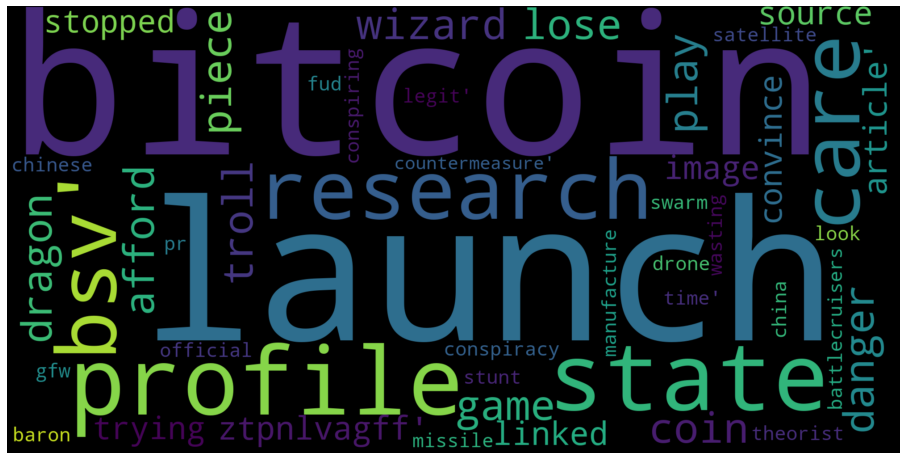

In [76]:
cleaned_wordcloud_generator(lopp)

In [77]:
set_date(lopp)

#creating the combined dataframe
lopp_combined = lopp.groupby(['tweet_day'])['cleaned_tweets'].apply(' ' .join).reset_index()

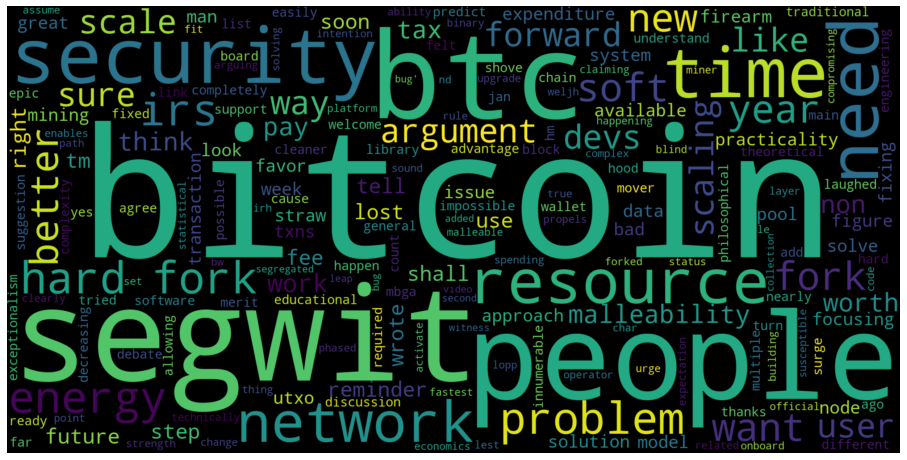

In [78]:
cleaned_wordcloud_generator(lopp_combined)

In [79]:
PeterLBrandt.drop_duplicates(subset='tweet_id', inplace=True)
top_retweets(PeterLBrandt)

,text,likes,retweets,timestamp
1314,"Bitcoin takes aim at $100,000 target. $btcusd is experiencing its fourth parabolic phase dating back to 2010. No other market in my 45 years of trading has gone parabolic on a log chart in this ma...",11578,4144,2019-06-22 03:20:19
12110,"Millennials embrace $BTC et al, in part, as reaction to $217 Tril of global debt and massive wealth inequality forced upon them by Gen X and B-Boomer parents and grandparents. Cryptos are statemen...",6847,2443,2018-02-03 15:32:02
1093,Either from Dec '18 low or from retest of same (circa analog dbl bottom in 2015) it would not surprise me if $BTC enters a new parabolic phase. $btcusdpic.twitter.com/XV89Qz7P4n,7539,2414,2019-04-05 12:58:23
6974,Wow!!! $BTC challenging upper resistance line of parabolic advance. This is biggest bull market of my 43 years of as a trader.pic.twitter.com/1uNuTyRd02,4247,1847,2017-11-26 00:07:27
6869,"Blowing through resistance on a log graph -- in 42 years of trading I have NEVER seen anything like this. $BTC $btcusd #Bitcoin Pay attention folks, you may never see something like this again.pic...",3707,1807,2017-11-29 02:35:36
1553,"The last time Factor's benchmark weekly MA was in the current profile of turning from down to up was in Nov 2015 just as $BTC began its move from $340 to $19,800.pic.twitter.com/uFJSkV9NwM",4911,1541,2019-05-02 21:19:38
6570,"Fellow crypto traders -- enjoy this experience. Spend your profits wisely (pay off student loans, don't buy a Ferrari). There has never been a market like this, and won't be another in your lifeti...",4338,1475,2017-12-12 14:03:25
1329,People ask me why I trade Bitcoin $BTC\n\nAsk no more!\n\nIn my 45-year trading career there has never been another market like Bitcoin.pic.twitter.com/K3paF2yIEi,5006,1394,2019-06-19 12:25:21
12019,The best advice I can offer newbies:\n1. Limit loss per trade to 1% of capital (2% max)\n2. Learn that 80% of trades are throw-aways. Play for the 20%.\n3. Don't worry about catching tops/bottoms....,5097,1335,2018-02-07 00:03:08
2536,$BTC is entering the stage of its life cycle when stale and weak money capitulates and strong hands accumulate strategically,5347,1321,2018-11-25 01:54:21


In [80]:
PeterLBrandt[['text']]

,text
0,Actually I know exactly what was behind. Nothing for 100 yds.pic.twitter.com/YseiL2rYea
1,Air rifle
2,"A Premium #Factormembers post was issued ""Factor Special Report on Gold and COT data, December 2019"". Please see here https://www.peterlbrandt.com/premium-reports/ … for more details."
3,TY Mike
4,The book I will be working on next year for Wiley will devote attention to the subjects of:\nSizing\nMoving trades to break-even\nExiting early\nRiding trades to completion
...,...
12414,I get that -- and they deserve to be furious that their baby-boomer grandparents laid on them an impossible debt load
12415,"John, that is correct. I was a massive bull up until Dec based on parabolic advance and called several legs nail on. The trolls have limited memory and limited ability to read and understand."
12416,If you cannot figure it out yourself I won't spend the time to explain it to you. Blocked.
12417,"Am doing paper on what conditions must be met for me to be wrong. Will not publicly post it, but I will DM to you"


In [81]:
cleaning_tweets(PeterLBrandt)

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.youtube.com/watch?v=hLpE1Pa8vvI&feature=youtu.be …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "http://www.cftc.gov/MarketReports/CommitmentsofTraders/index.htm …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://chatwithtraders.com/podcast-episodes/ …" looks like a URL. Beautiful Soup is not an HTTP clien

0                                                                                                     actually know exactly behind nothing yds yseil ryea
1                                                                                                                                               air rifle
2                                                        premium factormembers post issued factor special report gold cot data december please see detail
3                                                                                                                                                 ty mike
4                              book working next year wiley devote attention subject sizing moving trade break even exiting early riding trade completion
                                                                               ...                                                                       
12414                                                                       

In [82]:
PeterLBrandt[['cleaned_tweets']]

,cleaned_tweets
0,actually know exactly behind nothing yds yseil ryea
1,air rifle
2,premium factormembers post issued factor special report gold cot data december please see detail
3,ty mike
4,book working next year wiley devote attention subject sizing moving trade break even exiting early riding trade completion
...,...
12414,get deserve furious baby boomer grandparent laid impossible debt load
12415,john correct massive bull dec based parabolic advance called several leg nail troll limited memory limited ability read understand
12416,cannot figure spend time explain blocked
12417,paper condition must met wrong publicly post dm


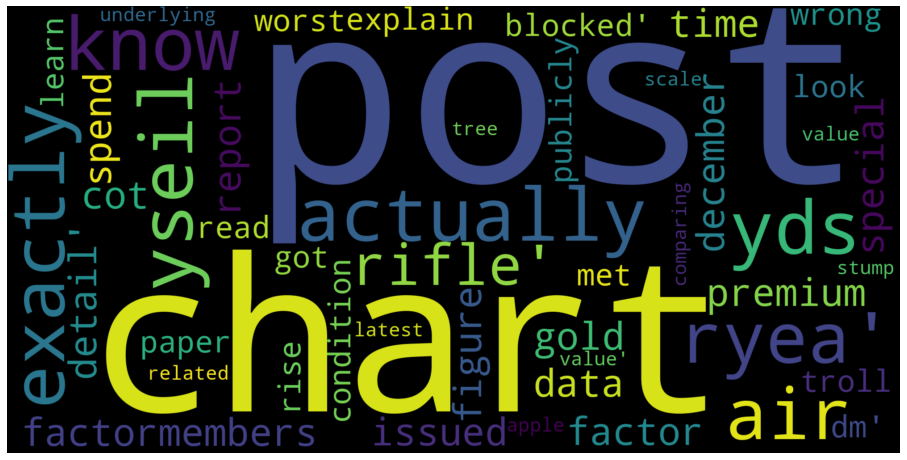

In [83]:
cleaned_wordcloud_generator(PeterLBrandt)

In [84]:
set_date(PeterLBrandt)

#creating the combined dataframe
PeterLBrandt_combined = PeterLBrandt.groupby(['tweet_day'])['cleaned_tweets'].apply(' ' .join).reset_index()

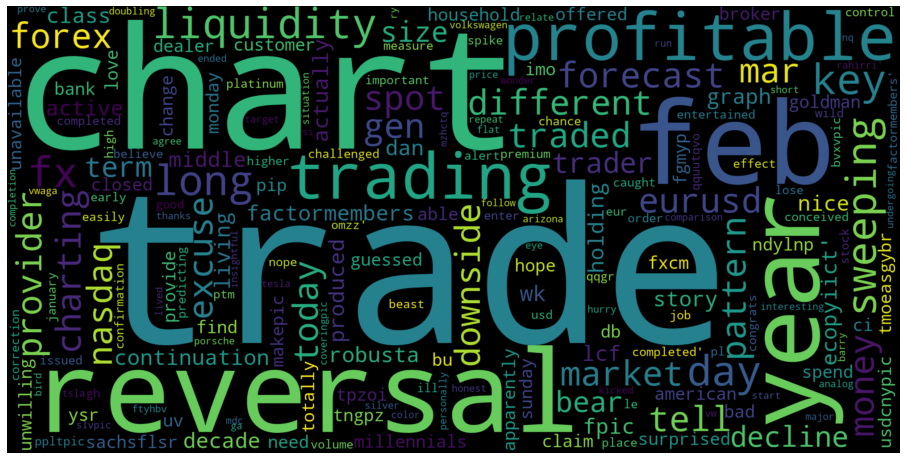

In [85]:
cleaned_wordcloud_generator(PeterLBrandt_combined)

Peter Brandt publishes technical analysis of financial markets on his twitter profile and not just bitcoin.

In [86]:
PeterSchiff.drop_duplicates(subset='tweet_id', inplace=True)
top_retweets(PeterSchiff)

,text,likes,retweets,timestamp
6604,"Since Princeton University is removing Woodrow Wilson's name from its buildings due to his racist thinking and policies, I think we should also repeal the Federal Income Tax and The Federal Reserv...",25476,7958,2020-06-27 19:04:14
8026,"Powell also announced that the Federal Reserve eliminated all reserve requirements for banks, which are now free to make as many loans as they want regardless of the level of Federally insured dep...",5844,1884,2020-03-15 22:41:11
7507,"JP Morgan Chase, the nation's largest lender, announced that effective Tues. homebuyers will need FICO scores of 700 and 20% down payments to qualify for a mortgage. Housing prices will have to cr...",4610,1837,2020-04-12 01:58:48
7553,"The national debt just passed $24 trillion, up $4 trillion since @realDonaldTrump took office. He will add more debt in 4 years than Bush did in 8. If reelected he will add more debt in 8 years th...",6611,1803,2020-04-08 21:04:36
6909,"If you think the rioting and looting are bad now, wait until the supplemental unemployment benefits expire, or inflation wipes out their value. What happens when price controls or rationing lead t...",5989,1668,2020-05-30 14:46:57
3552,"Agree, too many getting rich making movies. Entertainment should be free, a public good. No one should profit from it. That's exploitation. Entertainment is a human right. Let's create a Dept. of ...",5583,1336,2019-12-03 04:25:47
8029,Everyone retweet and like. Let's see if we can make this video go viral.https://www.youtube.com/watch?v=cpWcnQGg-Bk …,2388,1251,2020-03-15 21:47:39
5664,I just lost all the #Bitcoin I have ever owned. My wallet got corrupted somehow and my password is no longer valid. So now not only is my Bitcoin intrinsically worthless; it has no market value ei...,5187,1248,2020-01-19 15:03:13
6774,So far in 2020 97% of the people shot to death by police were men. This gender disparity has persisted for years. Are the police racist AND sexist? Perhaps the nearly exclusive depiction of males ...,5562,1205,2020-06-13 17:51:23
7878,The #Coronavirus will be the scapegoat. The U.S. economy was headed for a crash anyway due to the reckless and incompetent monetary and fiscal policies of the past. Now the Coronavirus will be the...,4877,1181,2020-03-21 21:50:32


In [87]:
PeterSchiff[['text']]

,text
0,"Cryptocurrency like Bitcoin is taking the market by storm, but its volatility should raise questions:http://bit.ly/2mkKUb0"
1,"Before you dive into the Bitcoin craze, you should see why it's one of the most volatile currencies around: http://bit.ly/2mkKUb0"
2,[Trump100] The President has proven that he will be merely another chapter in the same Keynesian book.http://bit.ly/2mm3iRi
3,Trump aims to increase the military budget by slashing the budgets of other bloated government organizations: http://bit.ly/2mm3iRi
4,Making government greater will not make America great again. A new chapter in the same Keynesian book will not change the story.
...,...
8165,Senator @BernieSanders points out that young people want a $15 Federal minimum wage. That's hardly a surprise as young people want a lot of foolish things. The difference is that Sanders is old en...
8166,"I agree with @BernieSanders that the war on drugs is a failure. It's a war on liberty that has turned a health problem into a criminal problem, with inner cities and minorities being the biggest c..."
8167,It was up slightly last week when I tweeted to sell as I thought the small rise would disappoint buyers who had anticipated a much larger rise.
8168,Yes I most definitely called this drop. Read all my bitcoin tweets from last week. Listen to my Podcast from Thursday when I said the Coronavirus was the pin that pricked the Bitcoin bubble.


In [88]:
cleaning_tweets(PeterSchiff)

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "http://www.Goldmoney.com " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://youtu.be/by1OgqQQANg " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://geology.com/minerals/gold/uses-of-gold.shtml …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the 

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.schiffradio.com/gold-keeps-knocking-on-1800s-door/ …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.youtube.com/watch?v=Qd15JoUnEfE&feature=youtu.be …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.youtube.com/watch?v=bSOEywn-2hw&feature=youtu.be …" looks like a URL. Beautiful Soup is not 

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.federalreserve.gov/newsevents/pressreleases/monetary20200317b.htm …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://libertarianinstitute.org/articles/why-price-gouging-actually-helps-during-a-crisis …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://moneyandmarkets.com/peter-schiff-federal-reserve-st

0                                                                                             cryptocurrency like bitcoin taking market storm volatility raise question
1                                                                                                                   dive bitcoin craze see one volatile currency around
2                                                                                                          trump president proven merely another chapter keynesian book
3                                                                                    trump aim increase military budget slashing budget bloated government organization
4                                                                                  making government greater make america great new chapter keynesian book change story
                                                                                     ...                                                                        

In [89]:
PeterSchiff[['cleaned_tweets']]

,cleaned_tweets
0,cryptocurrency like bitcoin taking market storm volatility raise question
1,dive bitcoin craze see one volatile currency around
2,trump president proven merely another chapter keynesian book
3,trump aim increase military budget slashing budget bloated government organization
4,making government greater make america great new chapter keynesian book change story
...,...
8165,senator point young people want federal minimum wage hardly surprise young people want lot foolish thing difference sander old enough know better
8166,agree war drug failure war liberty turned health problem criminal problem inner city minority biggest casualty surprised sander promising free weed human right
8167,slightly last week tweeted sell thought small rise would disappoint buyer anticipated much larger rise
8168,yes definitely called drop read bitcoin tweet last week listen podcast thursday said coronavirus pin pricked bitcoin bubble


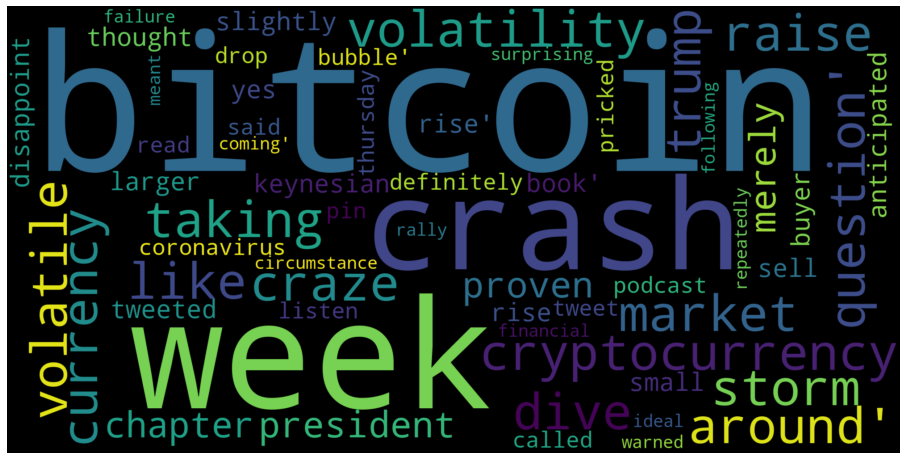

In [90]:
cleaned_wordcloud_generator(PeterSchiff)

In [91]:
set_date(PeterSchiff)

#creating the combined dataframe
PeterSchiff_combined = PeterSchiff.groupby(['tweet_day'])['cleaned_tweets'].apply(' ' .join).reset_index()

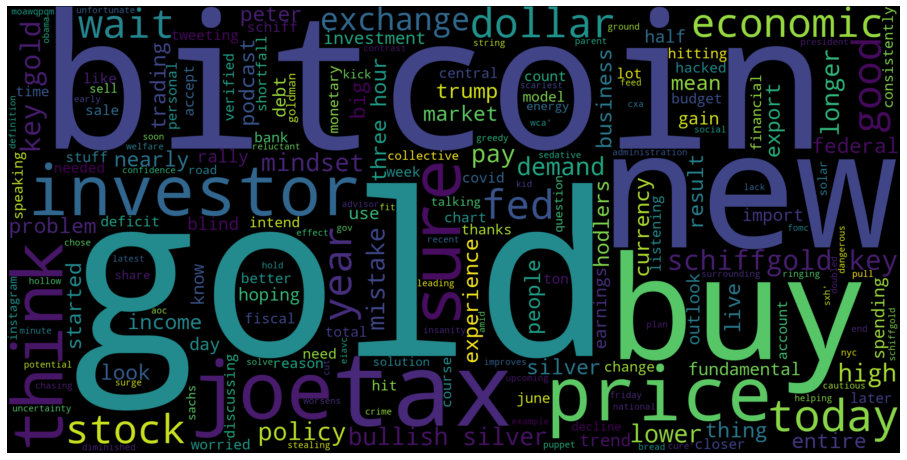

In [92]:
cleaned_wordcloud_generator(PeterSchiff_combined)

In [93]:
DoveyWan.drop_duplicates(subset='tweet_id', inplace=True)
top_retweets(DoveyWan)

,text,likes,retweets,timestamp
420,Perspective matters ...pic.twitter.com/BOk7p4z7Ex,59913,34471,2018-12-09 20:01:25
5319,"WOW BITCOIN IS LEGALLY PROTECTED IN CHINA \n\nToday the first property dispute case on Bitcoin finalized trial in a local Chinese court. The court confirmed the ""virtual property"" attribute of Bi...",2841,968,2019-07-18 19:58:28
1348,"BREAKING \n\nBithumb is being hacked, at its EOS cold storage level!!! Over 3million EOS has been transferred out \n\nDetail to be reported, confirmed by security firm who’s auditing for Bithumb",1487,697,2019-03-30 03:54:46
278,Someone said it's unfair to compare Binance with Deutsche Bank (Exchange vs Bank) so I made this Now it's apple to apple I suppose? @cz_binance @heyibinancepic.twitter.com/HxCBSKIAnx,1655,598,2018-08-30 08:24:09
4978,"JUST IN \n\nas per sir @loomdart ‘s request, this thread is abt the on-going sells off made by PLUS Token, the biggest Chinese PONZI which scammed ~70K $BTC + ~ 800K $ETH \n\nI mentioned it briefl...",992,515,2019-08-14 17:08:52
4993,HK airport is being completely taken over and all flight cancelled today on Monday afternoon ... \n\nIt’s on the verge of something major tfwpic.twitter.com/nAFNlG7MFv,1548,511,2019-08-12 12:07:29
2232,"there is clear over-supply of PPE now in China: all manufactures which are qualified/capable turned to produced PPE starting 2 months ago, over 90% of N95 rated masks and other related items are m...",858,372,2020-03-26 05:22:42
3288,"Official announcement from PBOC, this might the first bank run and bank bailout by PBOC after 1979 (Chinese economic reform) \n\nBaoshang Bank, a commercial bank with ~10k employees and over $61B...",600,364,2019-05-24 12:30:41
4319,BREAKING\n\n1M $BCH sim hack!! worth $30M from 1 single Chinese whale (he claimed lost $15M $BTC too) He's now asking for help from miners ..I'm talking with top BCH pool owners on this OMFG\n\n\n...,728,287,2020-02-22 04:30:54
1720,"12 hours after the major ""Xi Pump"" \n\n1. ""Blockchain"" headlined on People's Daily print version today \n2. Top Universities in China start ""Blockchain"" course offering overnight \n3. Expect to se...",694,239,2019-10-26 00:33:11


In [94]:
DoveyWan[['text']]

,text
0,HBO Silicon Valley should script this into its new season ;)
2,Has to be on wechat with an official wechat account. Also can partner with a few vertical AI media there
4,https://lnkd.in/gQYB_bV can't be more excited to partner with Bram on his new initiative
6,https://altcointoday.com/tron-founder-aims-to-decentralize-the-internet-by-acquiring-bittorrent/ … so... it will be renamed into BitTronit ??
7,Super bullish on both NewsDog and CNN Protocol. https://www.forbes.com/sites/andrewrossow/2018/05/02/it-wasnt-a-data-leak-facebook-was-the-medium-playing-the-messenger/ …https://twitter.com/forres...
...,...
5552,The summer of San Francisco is just perfect pic.twitter.com/QwsJj521ZK
5553,Ya this one it’s well known and in Shanghai everywhere haha
5554,"Now it’s official - @cz_binance bought a bank and named it after himself \n\nLong CZ, short bankerspic.twitter.com/sVSIa2RkyK"
5555,Chaincode’s founders are badass HFT who made millions in their previous trading life already and now funding bitcoin devs out of their own pockets...


In [95]:
cleaning_tweets(DoveyWan)

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/StarkWareLtd/status/1018685807148879873 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.investor.gov/additional-resources/news-alerts/press-releases/sec-says-social-media-ok-company-announcements-if …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://cn.etherscan.com/tx/0xca4e0aa223e3190

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/doveywan/status/1153706666799636480?s=21 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/doveywan/status/1153098126812749825?s=21 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup


0                                                                        hbo silicon valley script new season
2                                              wechat official wechat account also partner vertical ai medium
4                                                                         excited partner bram new initiative
6                                                                                           renamed bittronit
7                                                                          super bullish newsdog cnn protocol
                                                        ...                                                  
5552                                                                    summer san francisco perfect qwsjj zk
5553                                                               ya one well known shanghai everywhere haha
5554                                   official binance bought bank named long cz short bankerspic svsia rkyk
5555      

In [96]:
DoveyWan[['cleaned_tweets']]

,cleaned_tweets
0,hbo silicon valley script new season
2,wechat official wechat account also partner vertical ai medium
4,excited partner bram new initiative
6,renamed bittronit
7,super bullish newsdog cnn protocol
...,...
5552,summer san francisco perfect qwsjj zk
5553,ya one well known shanghai everywhere haha
5554,official binance bought bank named long cz short bankerspic svsia rkyk
5555,chaincode founder badass hft made million previous trading life already funding bitcoin devs pocket


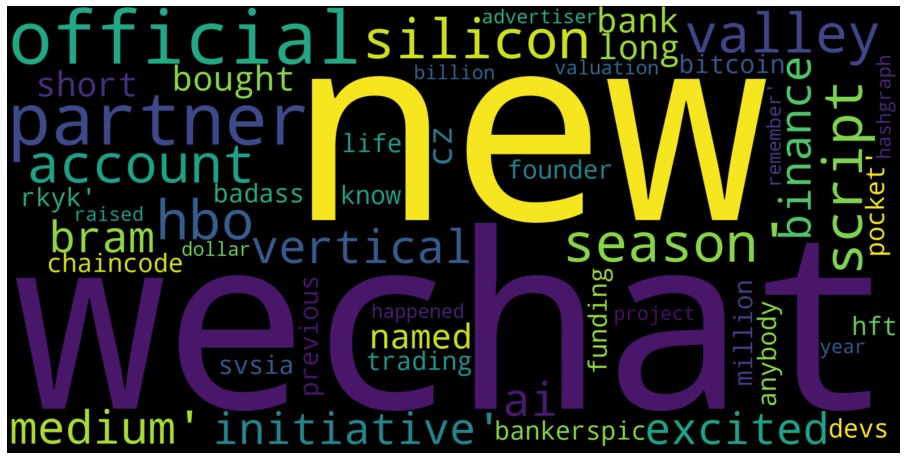

In [97]:
cleaned_wordcloud_generator(DoveyWan)

In [98]:
set_date(DoveyWan)

#creating the combined dataframe
DoveyWan_combined = DoveyWan.groupby(['tweet_day'])['cleaned_tweets'].apply(' ' .join).reset_index()

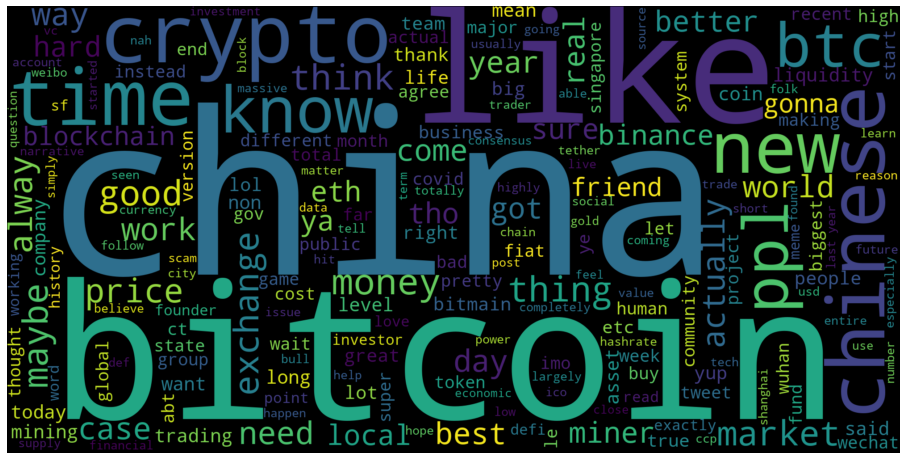

In [99]:
cleaned_wordcloud_generator(DoveyWan_combined)

In [100]:
real_vijay.drop_duplicates(subset='tweet_id', inplace=True)
top_retweets(real_vijay)

,text,likes,retweets,timestamp
5743,"When I worked at Google, as an engineer on Google News, I was asked to write code to censor news articles in China (circa 2006). I refused and they took me off the project and put someone else on ...",6794,3356,2018-09-16 05:06:07
3704,"""Owning bitcoins is one of the few asymmetric bets that people across the entire world can participate in."" \n\nThe Bullish Case for Bitcoin is now published as a single shareable article:\n\nhttp...",4229,1897,2018-03-02 15:15:18
4791,1/ 10 years ago today (Fri 6:10pm 2008-10-31 UTC) Satoshi Nakamoto announced the creation of #Bitcoin to the cryptography mailing list. Satoshi's creation is the most important innovation to money...,1957,1023,2018-10-31 00:00:13
1432,"1/ 10 years ago today, in an unknown location, a mysterious figure whose identity is still unknown, tapped a key on his keyboard, spurring his CPU into action.\n\nIn doing so, Satoshi reified his ...",1816,853,2019-01-03 00:04:59
5054,1/ We are in the early stages of a new #Bitcoin bull market. Let's explore what we know about such bull markets based on observations from the four major hype cycles that Bitcoin has already under...,1980,773,2019-06-20 06:51:55
4926,"1/ Google is working on a new search engine code-named ""Dragonfly"" that will aid China's effort to censor information from its citizenry.\n\nAs a former Google engineer I wanted to share some info...",1057,738,2018-10-15 06:44:39
6241,"1/ The most important news in the ""cryptocurrency space"" today is the gigantic IPO that @BITMAINtech intends to complete this year.\n\nBut even more astonishing is one of the details buried in the...",1440,590,2018-08-13 05:51:57
5865,"1/ #Ethereum is crashing (not just in USD terms but in BTC terms); has the demand for a decentralized world computer disappeared, or is something else at play? Let's consider the fundamentals from...",1000,445,2018-09-09 04:33:47
3346,"When I emigrated to the US from Australia 20 years ago, I believed I was moving to the land of opportunity where success would be lauded and excellence aspired to.\n\nYesterday I saw this poster n...",1987,401,2020-06-02 05:40:32
1615,"Everyone wants to find the next Bitcoin so they can make 10,000% per year.\n\nSorry to break it you, but Bitcoin is the next Bitcoin and the shitcoin you just bought is the next Enron.",1627,382,2018-01-16 03:58:09


In [101]:
real_vijay[['text']]

,text
0,https://www.cryptocoinsnews.com/asicboost-increases-profits-2000-bitcoin-miners-utilized-covertly/ …
1,"Great article explaining that off chain scaling is still possible, and likely https://medium.com/@jimmysong/why-bitcoin-will-get-scaling-without-segwit-or-large-blocks-772799fab021 …"
4,#grandma_yellen #HODLpic.twitter.com/JhXO1VQ7Io
5,When you deposit tuppence in a bitcoin account\nSoon you'll see that it blooms into credit of a generous amount: https://www.youtube.com/watch?v=XxyB29bDbBA …
6,"Ha! As both an Aussie and an American, I aver that $1 and $2 coins are a terrible nuisance. Nothing worse than a pocket full of loose change"
...,...
6299,"Have you ever looked at your watch and wondered if it's noon and it's like 830am, but you've already been awake 4 hours?"
6300,https://twitter.com/real_vijay/status/970178286906105856?s=19 …
6301,https://twitter.com/real_vijay/status/970178286906105856?s=19 …
6302,No.


In [102]:
cleaning_tweets(real_vijay)

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.cryptocoinsnews.com/asicboost-increases-profits-2000-bitcoin-miners-utilized-covertly/ …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://blog.stakeventures.com/articles/the-may-scale-of-money-hardness-and-bitcoin …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.reddit.com/r/Bitcoin/comments/6fh

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://mobile.nytimes.com/2017/08/03/style/what-is-cryptocurrency.html …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/ErikVoorhees/status/1126924006504796161?s=19 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/real_vijay/status/953114123855802369?s=19 …" looks like a URL. Beautifu

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/real_vijay/status/999071304803270656?s=19 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/real_vijay/status/1052401634028871681?s=19 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/bendavenport/status/1090779783644868611?s=19 …" looks like a URL. Beautiful Soup is

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/real_vijay/status/938639936084779008 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/real_vijay/status/916860034323169280 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/real_vijay/status/924124651118137344?s=17 …" looks like a URL. Beautiful Soup is not an HTTP c

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.cnbc.com/2017/10/19/josh-brown-goes-down-the-bitcoin-rabbit-hole-commentary.html …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "http://www.urbandictionary.com/define.php?term=ButtHurt …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/sapinker/status/915274076586995714 …" looks like a URL. Bea

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/real_vijay/status/1268654924092420096?s=19 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/real_vijay/status/1071129743825678336?s=19 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/real_vijay/status/980903968208400384 …" looks like a URL. Beautiful Soup is not an

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/real_vijay/status/899764018201542657 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/real_vijay/status/1022944261275234304?s=19 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/real_vijay/status/1022944261275234304 …" looks like a URL. Beautiful Soup is not an HTTP

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/real_vijay/status/1030505595088986112?s=19 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/real_vijay/status/904924873029369856?s=19 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/real_vijay/status/902205103137947648?s=19 …" looks like a URL. Beautiful Soup is no

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/real_vijay/status/1010294122064670720 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/real_vijay/status/1116005904665571329?s=19 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/real_vijay/status/1038646633594990592?s=19 …" looks like a URL. Beautiful Soup is not a

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/real_vijay/status/1019804185334722560?s=19 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup


0                                                                                            
1                                great article explaining chain scaling still possible likely
4                                                           grandma yellen hodlpic jhxo vq io
5                      deposit tuppence bitcoin account soon see bloom credit generous amount
6       ha aussie american aver coin terrible nuisance nothing worse pocket full loose change
                                                ...                                          
6299                                  ever looked watch wondered noon like already awake hour
6300                                                                                         
6301                                                                                         
6302                                                                                         
6303                                                        

In [103]:
real_vijay[['cleaned_tweets']]

,cleaned_tweets
0,
1,great article explaining chain scaling still possible likely
4,grandma yellen hodlpic jhxo vq io
5,deposit tuppence bitcoin account soon see bloom credit generous amount
6,ha aussie american aver coin terrible nuisance nothing worse pocket full loose change
...,...
6299,ever looked watch wondered noon like already awake hour
6300,
6301,
6302,


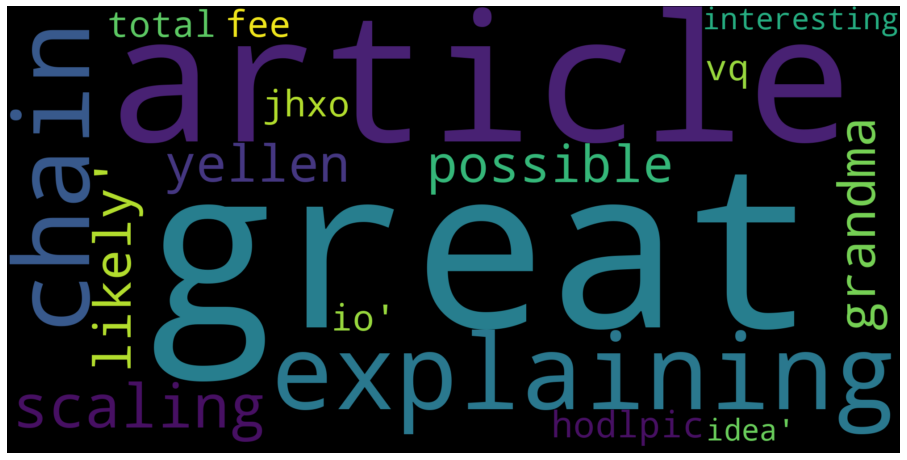

In [104]:
cleaned_wordcloud_generator(real_vijay)

In [105]:
set_date(real_vijay)

#creating the combined dataframe
real_vijay_combined = real_vijay.groupby(['tweet_day'])['cleaned_tweets'].apply(' ' .join).reset_index()

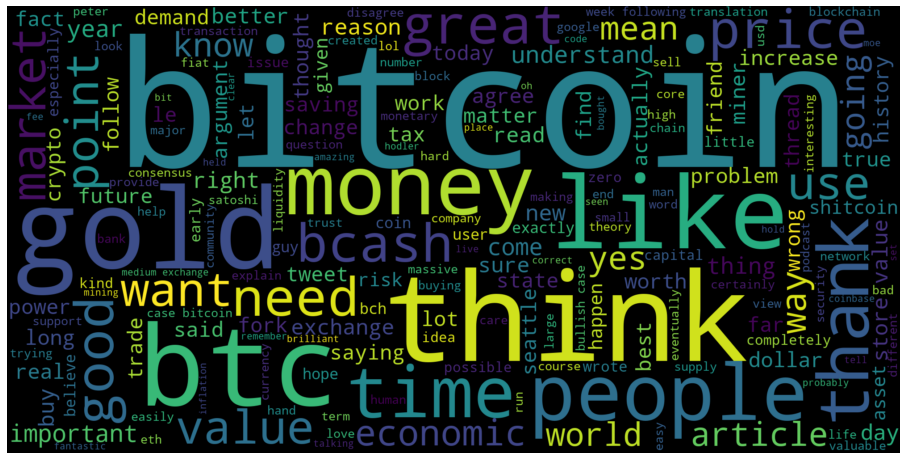

In [106]:
cleaned_wordcloud_generator(real_vijay_combined)

In [107]:
real_vijay_combined.drop(real_vijay_combined.loc[real_vijay_combined['cleaned_tweets']== ''].index, inplace=True)

In [108]:
real_vijay_combined.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 954 entries, 0 to 987
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   tweet_day       954 non-null    datetime64[ns]
 1   cleaned_tweets  954 non-null    object        
dtypes: datetime64[ns](1), object(1)
memory usage: 22.4+ KB


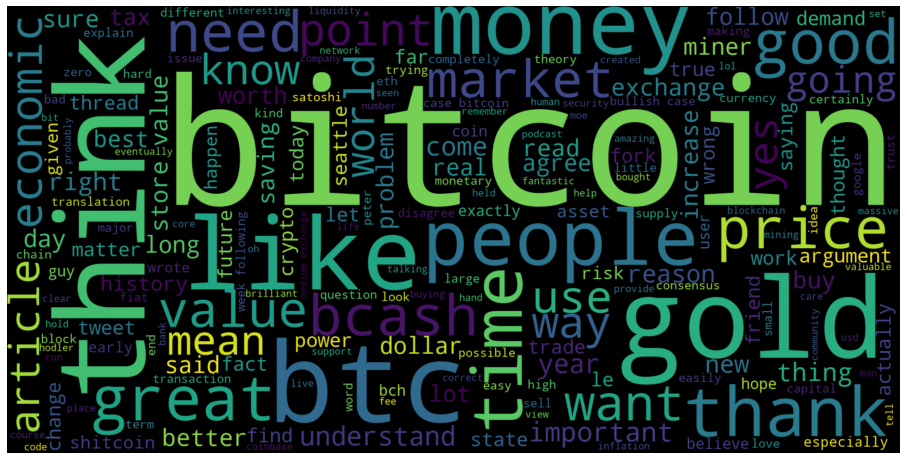

In [109]:
cleaned_wordcloud_generator(real_vijay_combined)

In [110]:
rogerkver.drop_duplicates(subset='tweet_id', inplace=True)
top_retweets(rogerkver)

,text,likes,retweets,timestamp
1294,"Since Bitcoin Core is no longer usable as a currency, we should no longer consider it to be a crypto currency.",3115,19148,2017-12-14 00:19:21
689,If reality is contradicting your preconceived opinions then your premises are likely flawed. Study economics to understand why #BitcoinCash will win wider adoption than 1MB Segwit Bitoin shortly....,1183,13851,2017-11-10 18:33:57
876,Industries lobbying against legal marijuana - \n\n* Alcohol *\n* Tobacco * \n* Big pharma * \n* Police unions *\n* Private prisons *\n* Prison guard unions *\n\nThe same ones that stand to lose mo...,22898,8025,2018-12-26 13:49:35
1296,Who wants a Bitcoin Cash Visa debit card? http://Bitcoin.com is going to be bringing it to you soon!pic.twitter.com/xcjlJzM5jp,4950,4429,2017-12-11 16:12:51
1314,I'll do my best to use http://Bitcoin.com to educate the world about how Bitcoin Core is no longer the Bitcoin that was described on the original http://Bitcoin.org website or in the Satoshi Whi...,3102,3572,2017-11-22 15:57:14
248,Don’t like Amazon? \n - Don’t shop there\nDon’t like McDonald’s?\n - Don’t eat there \nDon’t like Walmart? \n - Don’t shop there\nDon’t like Bitcoin Cash\n - Don’t use it.\...,6845,1607,2020-01-26 01:18:37
944,"If YOU are worried about the coronavirus, YOU should self isolate. \nLeave the rest of us alone.pic.twitter.com/9DUzsdtnCy",4278,1483,2020-03-29 14:01:53
1085,Good advice:pic.twitter.com/5drxRwF5pN,4219,1478,2018-05-02 15:36:41
976,Cheney was never indicted.\n\nBush was never indicted. \n\nBolton was never indicted. \n\nMattis was never indicted. \n\nRevealing crime is more dangerous than committing crime.\n#FreeAssangepic.t...,4454,1386,2019-04-12 13:06:46
1285,The reason there is so much hostility from Bitcoin Core towards Bitcoin Cash is because Core knows they have stolen the name but are advocating a completely different system than what was original...,2599,1077,2017-12-19 20:38:22


In [111]:
rogerkver[['text']]

,text
0,".@Excellion, I hear you arrive in Tokyo today. Are you willing to actually have a public debate with me this time?https://forum.bitcoin.com/bitcoin-discussion/roger-ver-vs-samson-mow-debate-threa..."
1,"Bitcoin would already have near zero tx fees, highly reliable zero confirmation txs and massive on chain scalability if not for Blockstream"
2,Experimenting with Bitcoin to be the first coin in history to have blocks be full all the time is incredibly reckless.
3,"""The block size limit wasn't added as an anti-spam mechanism until more than 21 months after the genesis block.""https://news.bitcoin.com/how-censorship-in-the-bitcoin-ecosystem-duped-people-into-e..."
4,"Today I will be on @FreeTalkLive, the radio show that has done more to spread Bitcoin than any other in the world.https://steemit.com/bitcoin/@ftlian/roger-ver-aka-bitcoin-jesus-to-be-interviewed-..."
...,...
1393,"All of the worst human atrocities were done in the name of the law, not in spite of the law."
1394,Government uses inflation to steal your wealth.pic.twitter.com/iiNpqBeKk0
1395,Bitcoin Cash supporters never left Bitcoin.\nBCH is peer to peer electronic cash.\nBTC left Bitcoin.pic.twitter.com/kh4Hc0H3lN
1396,"If you see something, say something.\n#FreeAssangepic.twitter.com/lnwJ6nL3EK"


In [112]:
cleaning_tweets(rogerkver)

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "http://Bitcoin.com pic.twitter.com/cl8ane5rem" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://youtu.be/NbNFJK1ZpVg pic.twitter.com/1onWDHpfMM" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "http://Local.bitcoin.com pic.twitter.com/ltOqMXahvQ" looks like a URL. Beautiful Soup is not an HTTP client. You should probably u

0                                                                         hear arrive tokyo today willing actually public debate time
1                   bitcoin would already near zero tx fee highly reliable zero confirmation tx massive chain scalability blockstream
2                                                        experimenting bitcoin first coin history block full time incredibly reckless
3                                                                      block size limit added anti spam mechanism month genesis block
4                                                                                          today radio show done spread bitcoin world
                                                                    ...                                                              
1393                                                                                     worst human atrocity done name law spite law
1394                                                          

In [113]:
rogerkver[['cleaned_tweets']]

,cleaned_tweets
0,hear arrive tokyo today willing actually public debate time
1,bitcoin would already near zero tx fee highly reliable zero confirmation tx massive chain scalability blockstream
2,experimenting bitcoin first coin history block full time incredibly reckless
3,block size limit added anti spam mechanism month genesis block
4,today radio show done spread bitcoin world
...,...
1393,worst human atrocity done name law spite law
1394,government us inflation steal wealth iinpqbekk
1395,bitcoin cash supporter never left bitcoin bch peer peer electronic cash btc left bitcoin kh hc h ln
1396,see something say something freeassangepic lnwj nl ek


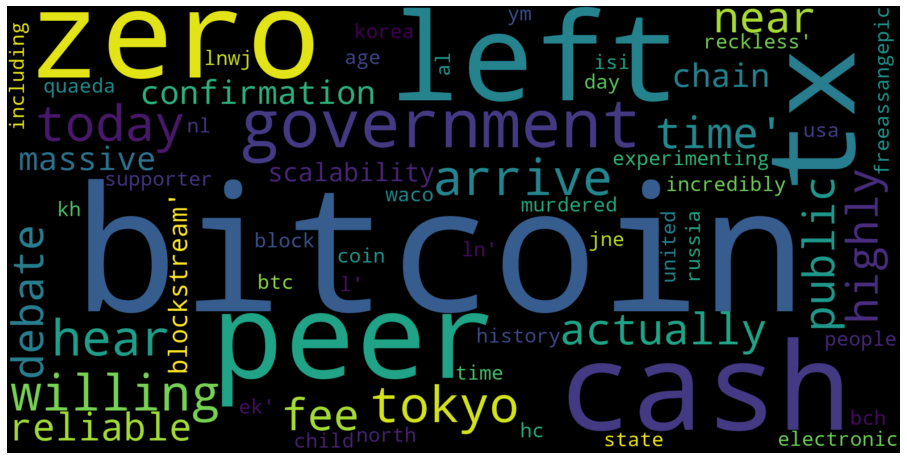

In [114]:
cleaned_wordcloud_generator(rogerkver)

In [115]:
set_date(rogerkver)

#creating the combined dataframe
rogerkver_combined = rogerkver.groupby(['tweet_day'])['cleaned_tweets'].apply(' ' .join).reset_index()

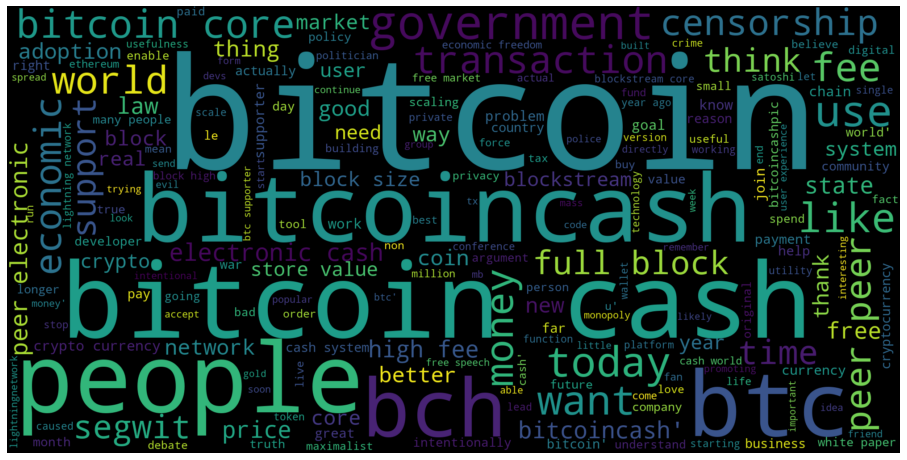

In [116]:
cleaned_wordcloud_generator(rogerkver_combined)

In [117]:
saifedean.drop_duplicates(subset='tweet_id', inplace=True)
top_retweets(saifedean)

,text,likes,retweets,timestamp
3907,"Bitcoin has now been operating for ten years without confirming a single fraudulent transaction, and without deviating from its original monetary issuance schedule.\nDeal with it!",3148,853,2019-01-03 06:04:42
9965,"Libra whitepaper initial analysis: The only digital currency other than bitcoin that matters, and it could succeed massively. But it does not compete with bitcoin, it reinforces bitcoin's value pr...",2095,799,2019-06-18 12:25:47
2673,"Forget bankers, economists, politicians, journalists, or altcoins. \nBitcoin is up against the BIS, and THIS is The Final Boss it has to defeat:pic.twitter.com/1ahLtfZwdC",1484,661,2018-02-07 08:35:30
2859,"I have quit my university job & will now focus on teaching & publishing research on http://saifedean.com , directly to students & readers. \nUniversities are a waste of time, talent & money for pr...",3459,631,2019-10-26 15:11:33
6690,"If London hospitals are not overrun in two weeks, there is no escaping the conclusion that millions of livelihoods were destroyed by the largest outbreak of mass hysteria on history.https://twitte...",2424,629,2020-06-06 15:12:50
2425,"Watching a dying cancer patient take cannabis oil for 1st time will show you what a crime prohibition is. Pain relieved, appetite regained & life worth living again. It's not illegal because it's ...",1478,603,2018-03-12 07:00:07
9638,"If you're short on money or time, Yorick has pretty much summarized my entire book for you in this thread.https://twitter.com/ydemombynes/status/985560599248756736 …",1546,574,2018-04-15 18:35:28
1963,My answer to the question: what is the problem Bitcoin solves?\nhttps://www.spectator.co.uk/2018/11/the-problem-bitcoin-solves/ …,1118,467,2018-11-08 18:13:51
3045,Government employed actor who plays an economist on the internet wants you to believe government borrowing from your children to pay his salary is good for you by bundling himself and your childre...,1765,444,2019-10-06 13:56:19
2993,"Ten years ago today, 5,050 btc were sold for $5.02 in the first market transaction for bitcoin. \n\nToday, they'd be worth $42,171,792.50. \n\nA rise of 838,078,685%. \n\nhttps://www.blockchain.co...",1479,440,2019-10-12 06:40:33


In [118]:
saifedean[['text']]

,text
0,"The @Mises Institute have graciously provided a 1-stop-shop link for anyone interested in buying the physical books on the syllabus for my courses, at very reasonable prices. 10 books in total for..."
1,"If you signed up for ECO12: Principles of Economics II, you should have received an email today with instructions for the course and for Monday's lecture. \nPlease email me if you didn't receive i..."
2,Thank you!
3,Thank you!
4,"In bitcoin, you solve proof of work problems to get to issue new coins. In fiat, you get people in debt to get to issue new coins.https://twitter.com/janeygak/status/1235996227193524224 …"
...,...
12869,"If your analysts have memorized the multiplication table by heart, you should charge $1,000 per month."
12870,"Really? My publisher didn't inform me about someone buying the Thai rights. What is the Thai publisher's name, and do you have an idea when the book will be out? Thank you !!"
12871,"FTFY: Bitcoin *produces* as much global energy as Switzerland.\n\nOtherwise, Bitcoin and Switzerland would eventually finish all our ""global energy""https://twitter.com/BBCTech/status/1146387401943..."
12872,No


In [119]:
cleaning_tweets(saifedean)

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://saifedean.com/product/signed-copies-of-the-bitcoin-standard-and-principles-of-economics/ …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://youtu.be/zIfl-JjSIQQ " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://drmalcolmkendrick.org/category/cholesterol-statins/ …" looks like a URL. Beautiful Soup is not 

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "http://Localbitcoins.com " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://youtu.be/zh7jAq4niC0 " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/tombutlerbowdon/status/1278013716634775552 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests t

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.youtube.com/watch?v=V30tyaXv6EI …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/stephanlivera/status/1133205004544700416?s=19 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/NeerajKA/status/948613975012503555 …" looks like a URL. Beautiful Soup is not an HTTP client. You 

0        institute graciously provided stop shop link anyone interested buying physical book syllabus course reasonable price book total eco eco
1         signed eco principle economics ii received email today instruction course monday lecture please email receive sign course see syllabus
2                                                                                                                                          thank
3                                                                                                                                          thank
4                                                    bitcoin solve proof work problem get issue new coin fiat get people debt get issue new coin
                                                                          ...                                                                   
12869                                                                              analyst memorized multiplication table heart ch

In [120]:
saifedean[['cleaned_tweets']]

,cleaned_tweets
0,institute graciously provided stop shop link anyone interested buying physical book syllabus course reasonable price book total eco eco
1,signed eco principle economics ii received email today instruction course monday lecture please email receive sign course see syllabus
2,thank
3,thank
4,bitcoin solve proof work problem get issue new coin fiat get people debt get issue new coin
...,...
12869,analyst memorized multiplication table heart charge per month
12870,really publisher inform someone buying thai right thai publisher name idea book thank
12871,ftfy bitcoin produce much global energy switzerland otherwise bitcoin switzerland would eventually finish global energy
12872,


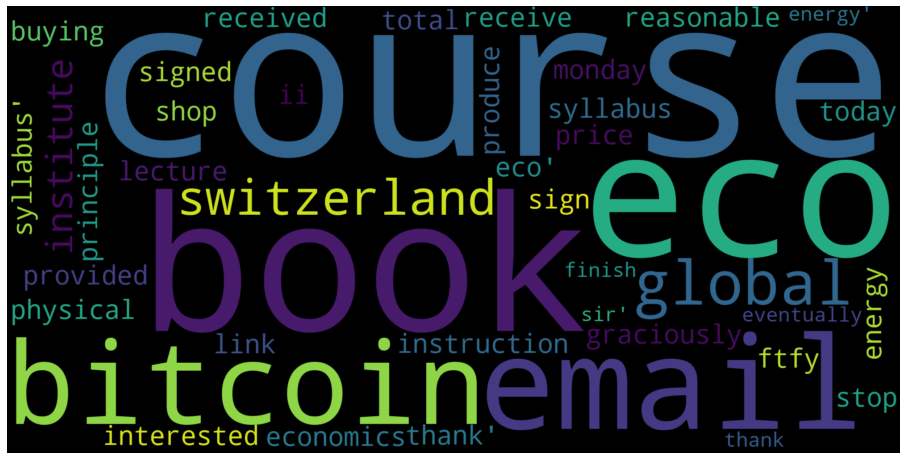

In [121]:
cleaned_wordcloud_generator(saifedean)

In [122]:
set_date(saifedean)

#creating the combined dataframe
saifedean_combined = saifedean.groupby(['tweet_day'])['cleaned_tweets'].apply(' ' .join).reset_index()

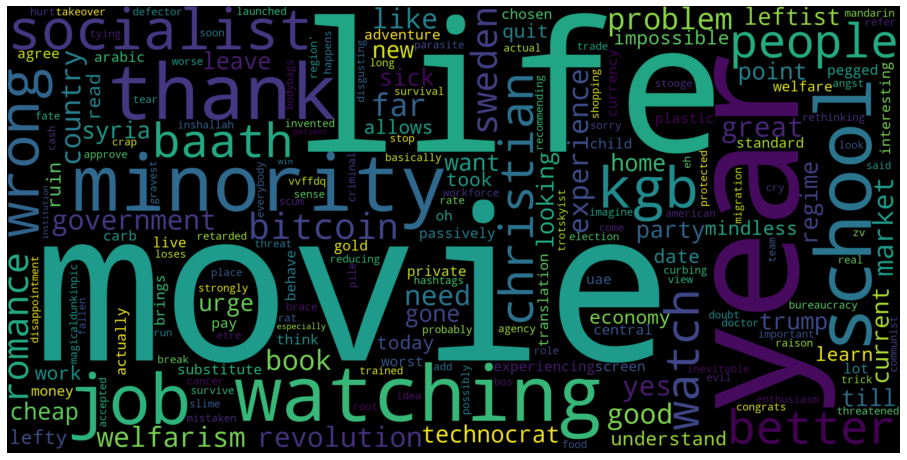

In [123]:
cleaned_wordcloud_generator(saifedean_combined)

In [124]:
saifedean_combined.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1033 entries, 0 to 1032
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   tweet_day       1033 non-null   datetime64[ns]
 1   cleaned_tweets  1033 non-null   object        
dtypes: datetime64[ns](1), object(1)
memory usage: 16.3+ KB


In [125]:
saifedean_combined.drop(saifedean_combined.loc[saifedean_combined['cleaned_tweets']== ''].index, inplace=True)

In [126]:
saifedean_combined.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1029 entries, 0 to 1032
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   tweet_day       1029 non-null   datetime64[ns]
 1   cleaned_tweets  1029 non-null   object        
dtypes: datetime64[ns](1), object(1)
memory usage: 24.1+ KB


In [127]:
stephanlivera.drop_duplicates(subset='tweet_id', inplace=True)
top_retweets(stephanlivera)

,text,likes,retweets,timestamp
9647,RT if you want to see @saifedean on @joerogan's show,881,737,2019-08-04 01:49:59
2234,"SLP52 @jack (CEO @square) & @starkness (CEO @lightning) - Bitcoin: Native Currency of the Internet\n\nEnjoy the podcast, and please share!https://stephanlivera.com/episode/52",1847,688,2019-02-11 12:38:20
9098,Bill Gates has done a lot more for the world than Bernie Sanders ever will,2907,324,2019-11-08 21:27:43
11498,"""My macro solution for this problem for everyone is to opt out and exit the economy as a whole, and the way we do that is by buying #bitcoin""https://twitter.com/nlebowitz1/status/12680026670429347...",780,191,2020-06-03 02:50:59
2250,I just recorded a phenomenal Bitcoin & Lightning podcast with @jack (of @Twitter @Square & @CashApp) and @starkness\n of @lightning!\n\nFollow/subscribe so you get it when it comes out Monday morn...,791,188,2019-02-10 00:25:40
8144,"The Fed has cut rates to zero. If you don't get why the world needs an alternative money & financial system like #Bitcoin now, you may never get it.",794,186,2020-03-15 21:32:31
11817,Bitcoin doesn't need celebrities. Celebrities need bitcoin.,1469,172,2020-05-16 10:02:27
7426,"SLP171 @100trillionUSD and @saifedean - #Bitcoin S2FX, S2F, and Evolution From Collectible to Financial Asset\n\nThis will be a YouTube Live + Periscope event 5/5/20 1pm CEST. Subscribe and be not...",560,168,2020-05-04 13:15:49
8219,"They will sell us lies:\n- ""It was coronavirus""\n- ""Not enough regulation""\n- ""Nobody could have seen this""\n\nlearn the truth:https://mises.org/library/what-has-government-done-our-money …",477,150,2020-03-09 07:28:46
7631,Here's @RaoulGMI on #bitcoin over the next 3-5 years. \n\nFrom $140B to $10T potentially\n\nSource: https://www.realvision.com/gmi?utm_source=twitter&utm_medium=social&utm_campaign=43943_GMI_BB_TW...,587,149,2020-04-24 04:45:32


In [128]:
stephanlivera[['text']]

,text
0,"Remember, bitcoin is a long term play. Short term up/down doesnt matter in the grand scheme"
1,"Nah, just HODLhttps://twitter.com/SamuelPatt/status/908495913320140801 …"
2,Super mega ultra ripped pemmican tabs! Now offered in ice blue flavour!
3,To be fair even with touch ID they could forcefully touch your finger to the phone to unlock
4,One less day til hyperbitcoinization!
...,...
11872,Great video
11873,Nice
11874,that's good! making lemonade from lemons as they say
11875,SLP172 Podcast transcript now available: https://stephanlivera.com/episode/172/ https://twitter.com/stephanlivera/status/1258735534639181825 …


In [129]:
cleaning_tweets(stephanlivera)

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "http://meatheals.com/ " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://youtu.be/--hsVknT1c0 " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://stephanlivera.com/episode/24 " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the 

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://stephanlivera.com/episode/84 " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://github.com/Samourai-Wallet/boltzmann …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://stephanlivera.com/ " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get th

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "http://proofofkeys.com " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://68.media.tumblr.com/d7b250ce46723efc115762ebbaa3cc09/tumblr_nzgopvxv6T1qfdneyo4_400.gif …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://github.com/bitcoin/bitcoin/blob/master/doc/descriptors.md …" looks like a URL. Beautiful Soup is not a

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://en.wikipedia.org/wiki/Capitol_Hill_Autonomous_Zone …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/SamouraiDev/status/1270393788113043456 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://stephanlivera.com/episode/176/ " looks like a URL. Beautiful Soup is not an HTTP client. You should pr

0        remember bitcoin long term play short term doesnt matter grand scheme
1                                                                          nah
2                super mega ultra ripped pemmican tab offered ice blue flavour
3                fair even touch id could forcefully touch finger phone unlock
4                                           one le day til hyperbitcoinization
                                         ...                                  
11872                                                              great video
11873                                                                     nice
11874                                           good making lemonade lemon say
11875                                         slp podcast transcript available
11876                                                        karen pushed onto
Name: cleaned_tweets, Length: 11547, dtype: object

In [130]:
stephanlivera[['cleaned_tweets']]

,cleaned_tweets
0,remember bitcoin long term play short term doesnt matter grand scheme
1,nah
2,super mega ultra ripped pemmican tab offered ice blue flavour
3,fair even touch id could forcefully touch finger phone unlock
4,one le day til hyperbitcoinization
...,...
11872,great video
11873,nice
11874,good making lemonade lemon say
11875,slp podcast transcript available


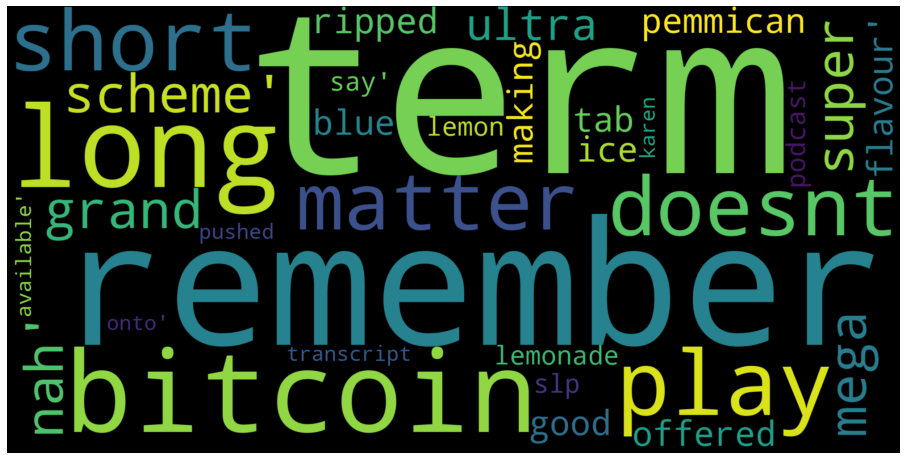

In [131]:
cleaned_wordcloud_generator(stephanlivera)

In [132]:
set_date(stephanlivera)

#creating the combined dataframe
stephanlivera_combined = stephanlivera.groupby(['tweet_day'])['cleaned_tweets'].apply(' ' .join).reset_index()

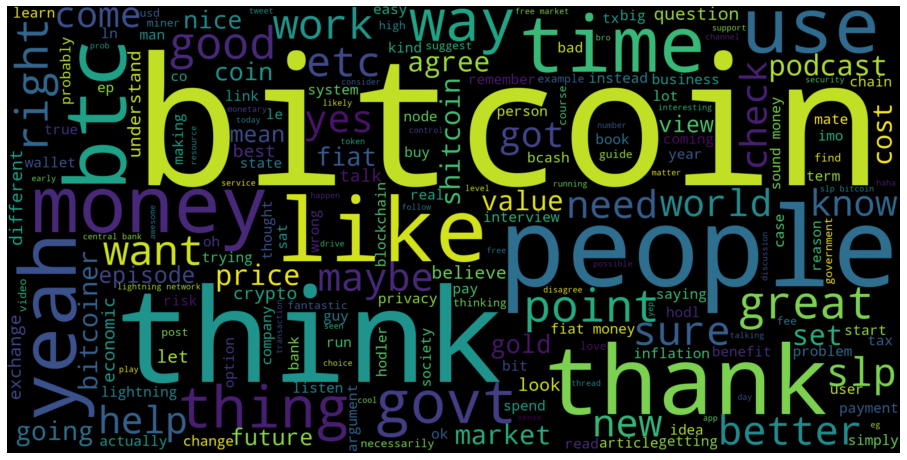

In [133]:
cleaned_wordcloud_generator(stephanlivera_combined)

In [134]:
winklevoss.drop_duplicates(subset='tweet_id', inplace=True)
top_retweets(winklevoss)

,text,likes,retweets,timestamp
781,Imagine if a phone company fact checked your calls or the Post Office fact checked your mail?,11394,2201,2020-05-29 15:32:44
833,"""Fact checking"" is a euphemism for editorializing which is a form of censorship. And that's a fact.",11524,2143,2020-05-28 14:36:28
909,"By investing in Bitcoin, you are facilitating a peaceful transfer of power from governments to the people.",6109,1176,2020-05-11 23:02:40
899,Why is no one talking about Georgia? It re-opened on April 24th. It's been 21 days and there has been no surge in new cases.pic.twitter.com/9QvC6WIBGR,3836,1125,2020-05-15 13:17:34
405,Some people think it's crazy to invest in crypto. Maybe. But definitely not as crazy as sitting on the sidelines when the future of money is literally being built before your eyes.,4381,1050,2019-05-20 13:56:39
671,"Let's make sure this time the guards don't fall asleep, go on long lunch breaks, that she has a cellmate, the cameras in front of her cell don't ""malfunction,"" and the tapes don't go ""missing.""htt...",3322,827,2020-07-02 14:15:06
276,"Money is an experiment that has been evolving for thousands of years. Don't mistake what is familiar for that which is ""real."" No form of money is more real than any other — it's just a matter of ...",2876,812,2019-06-25 18:33:42
355,"Bitcoin is underpinned by math and cryptography. Like gravity, it works, whether you believe in it or not.",3755,789,2019-06-20 18:02:54
689,"If a vaccine comes out, I'm not getting it. I don't want someone injecting me with a 5g chip. I'm not taking any chances.",5024,761,2020-06-30 19:44:17
112,"In 2018 everyone wanted to be in crypto. In 2019, we will find out who really wants to be in crypto.",3283,672,2018-12-10 17:51:54


In [135]:
winklevoss[['text']]

,text
0,@geminidotcom welcomes our first Chief Technology Officer! Rob Cornish joins us as CTO from the New York Stock Exchange (NYSE)https://medium.com/gemini/welcoming-our-first-chief-technology-officer...
1,@Geminidotcom welcomes our first Chief Technology Officer! https://medium.com/@winklevoss/blog-post-draft-1000319bd7be …
2,So much fun on the National Treasure 4 film… https://www.instagram.com/p/BjyLwe6nU6z/?utm_source=ig_twitter_share&igshid=11bn5xr479yvk …
6,Last week supporting the 19th Annual #amfarnewyork gala with @tylerwinklevoss #makingaidshistory https://www.instagram.com/p/BQeJa3tgC5F/
7,Ready for my closeup! #OceansEight #METGala #nightatthemuseum https://www.instagram.com/p/BPaRPVqgZep/
...,...
907,Someone's not getting a signed copy of Bitcoin Billionaires.
908,"Dear @aantonop why don't you watch the actual video before responding? The first word of my answer was ""Definitely."" \n\nhttps://twitter.com/aantonop/status/1259961760494338048 …"
909,"By investing in Bitcoin, you are facilitating a peaceful transfer of power from governments to the people."
910,"""NYTimes 09/Apr/2020 With $2.3T Injection, Fed’s Plan Far Exceeds 2008 Rescue"" -Bitcoin block 629,999"


In [136]:
cleaning_tweets(winklevoss)

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/winklevoss/status/1259497893922246657 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "http://zoom.com/ ...." looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://niftygateway.com/@cameron " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to ge

0                                    welcome first chief technology officer rob cornish join u cto new york stock exchange nyse
1                                                                                        welcome first chief technology officer
2                                                                                               much fun national treasure film
6                                                            last week supporting th annual amfarnewyork gala makingaidshistory
7                                                                            ready closeup oceanseight metgala nightatthemuseum
                                                                 ...                                                           
907                                                                             someone getting signed copy bitcoin billionaire
908                                                             dear watch actual video responding first

In [137]:
winklevoss[['cleaned_tweets']]

,cleaned_tweets
0,welcome first chief technology officer rob cornish join u cto new york stock exchange nyse
1,welcome first chief technology officer
2,much fun national treasure film
6,last week supporting th annual amfarnewyork gala makingaidshistory
7,ready closeup oceanseight metgala nightatthemuseum
...,...
907,someone getting signed copy bitcoin billionaire
908,dear watch actual video responding first word answer definitely
909,investing bitcoin facilitating peaceful transfer power government people
910,nytimes apr injection fed plan far exceeds rescue bitcoin block


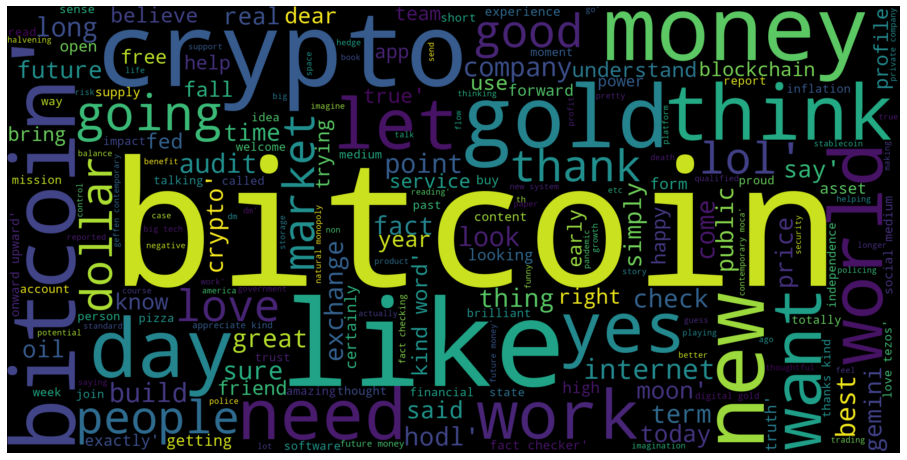

In [138]:
cleaned_wordcloud_generator(winklevoss)

In [139]:
set_date(winklevoss)

#creating the combined dataframe
winklevoss_combined = winklevoss.groupby(['tweet_day'])['cleaned_tweets'].apply(' ' .join).reset_index()

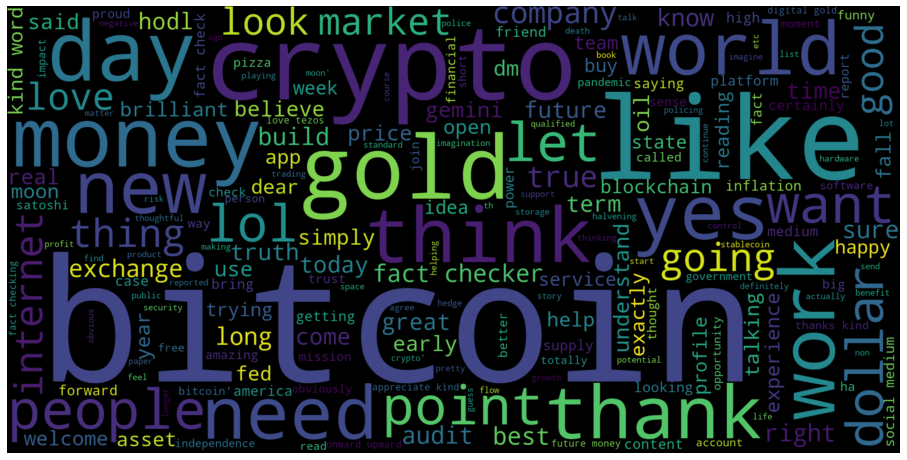

In [140]:
cleaned_wordcloud_generator(winklevoss_combined)

In [141]:
tylerwinklevoss.drop_duplicates(subset='tweet_id', inplace=True)
top_retweets(tylerwinklevoss)

,text,likes,retweets,timestamp
72,"Dear @BillGates there is an easy way to short bitcoin. You can short #XBT, the @CBOE Bitcoin (USD) Futures contract, and put your money where your mouth is! cc @CNBC @WarrenBuffetthttps://www.cnbc...",8552,2702,2018-05-07 18:44:48
1828,"Alarming Fact: Between 1990 and 2005, a new prison opened in the United States every 10 days. So either people decided to become criminals at a faster rate, or the government decided to manufactur...",5745,1612,2020-07-03 13:33:57
2240,YouTube at it again. Disturbing to say the least. I'm starting to forget which country I live in.https://nypost.com/2020/05/16/youtube-censors-epidemiologist-knut-wittkowski-for-opposing-lockdown/...,4185,1439,2020-05-17 14:22:42
2054,Fact checking makes you a publisher. Selectively fact checking makes you a biased publisher. Platforms that engage in this behavior are not neutral and should not be shielded from having to take r...,4599,1415,2020-05-28 21:25:45
1622,Cryptocurrency is the first money in the world that is governed entirely by math and not the legal-regulatory apparatus of high priests. This alone should give you pause.,6038,1407,2019-07-06 22:17:07
1531,"""Blessed are the HODLers, for they shall inherit the moon."" Satoshi 2:56",6560,1345,2019-07-18 15:43:29
1007,"Running out of toilet paper? Don't worry, the Fed is printing more.",6696,1238,2020-04-23 15:52:59
1231,Bitcoin is the only vaccine in the world that can give you immunity to the money printing disease.,5059,1097,2020-03-26 15:03:04
2100,Goldman Sachs: We do not recommend bitcoin on a strategic or tactical basis for clients’ investment portfolios...\n\nGoogle Translate: We don't want our clients to buy bitcoin and realize they don...,4823,1087,2020-05-27 17:47:42
687,"If bitcoin breaks 10k, you can bet it’s going to break 15k...",6491,1069,2019-06-19 16:50:37


In [142]:
tylerwinklevoss[['text']]

,text
0,Yep! http://geminiexchange.app.link/download
1,"Houston, we have lift off! The @Gemini Mobile App is now live! You can download it here: http://geminiexchange.app.link/download and check out our blog post here: http://ow.ly/UBLh30mW8gS"
4,It is not.
5,"Happy New Year!! 2017 was #ToTheMoon, let's all make sure 2018 is #ToMars! #TB… https://www.instagram.com/p/BdbZbO6BgM1/"
8,"Software Eng., Exchange Eng., Security Eng., Sr. SRE, Jr. SRE, Networking SRE, Sys Admin Eng., QA Eng., Junior Data Scientist"
...,...
2304,"Gold was your best hedge against inflation in the 1970's, before the invention of the personal computer, the Internet, and of course Bitcoin. But today, investing in gold is like choosing to send..."
2305,"Paul Tudor Jones didn't just say he has 1-2% of his net worth in gold to hedge against inflation, he said he has 1-2% of his net worth in Bitcoin to hedge against inflation."
2306,"Regardless of what happens geopolitically (e.g., pandemics, wars, etc.), Bitcoin's supply schedule is unwavering. It's remarkable to see the stark contrast between a currency that is transparent, ..."
2307,The Halvening is nigh!


In [143]:
cleaning_tweets(tylerwinklevoss)

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.youtube.com/watch?v=7sefHatyheE …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/tylerwinklevoss/status/1189981558305951746?s=21 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/benmezrich/status/1142039145122021376?s=12 …" looks like a URL. Beautiful Soup is not an HTTP cl

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/tylerwinklevoss/status/1280137105591631874?s=21 …https://twitter.com/tylerwinklevoss/status/1280137105591631874 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/tylerwinklevoss/status/1272530284882296835 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/benmezrich/st

0                                                                                                                                                                                                           yep
1                                                                                                                                                         houston lift mobile app live download check blog post
4                                                                                                                                                                                                              
5                                                                                                                                                              happy new year tothemoon let make sure tomars tb
8                                                                                                software eng exchange eng security eng sr sre jr sre networking sre sys

In [144]:
tylerwinklevoss[['cleaned_tweets']]

,cleaned_tweets
0,yep
1,houston lift mobile app live download check blog post
4,
5,happy new year tothemoon let make sure tomars tb
8,software eng exchange eng security eng sr sre jr sre networking sre sys admin eng qa eng junior data scientist
...,...
2304,gold best hedge inflation invention personal computer internet course bitcoin today investing gold like choosing send snail mail versus email
2305,paul tudor jones say net worth gold hedge inflation said net worth bitcoin hedge inflation
2306,regardless happens geopolitically e g pandemic war etc bitcoin supply schedule unwavering remarkable see stark contrast currency transparent programmatic deterministic versus currency managed gove...
2307,halvening nigh


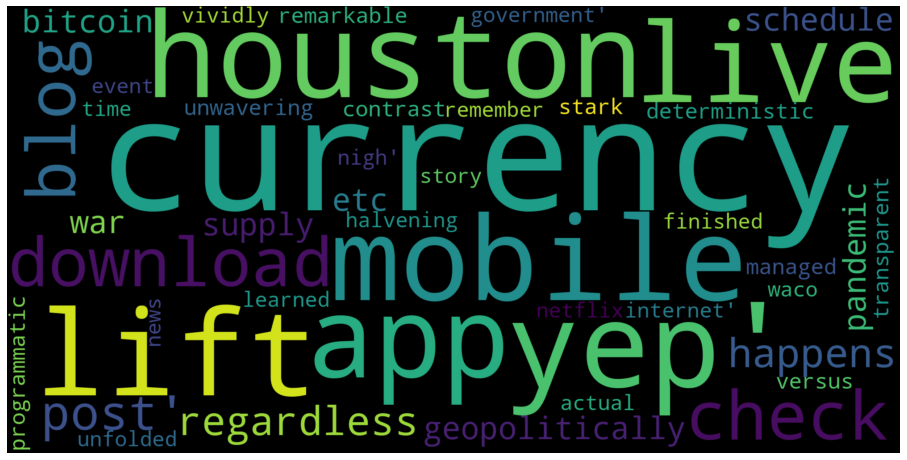

In [145]:
cleaned_wordcloud_generator(tylerwinklevoss)

In [146]:
set_date(tylerwinklevoss)

#creating the combined dataframe
tylerwinklevoss_combined = tylerwinklevoss.groupby(['tweet_day'])['cleaned_tweets'].apply(' ' .join).reset_index()

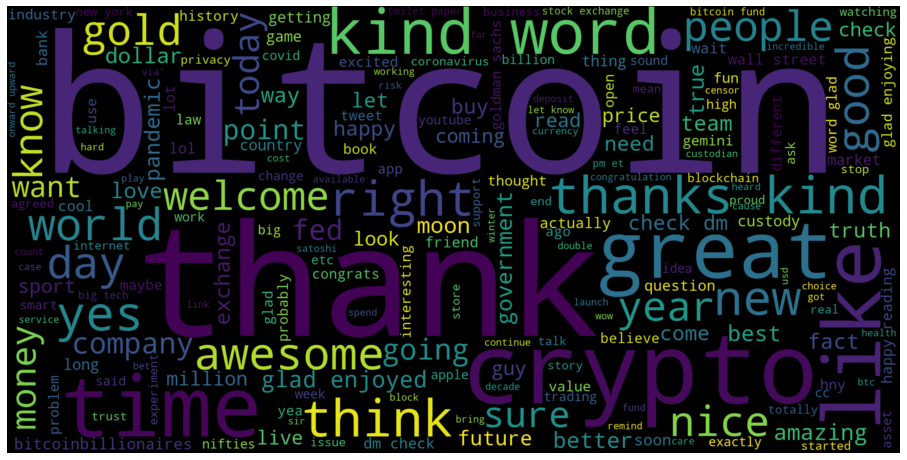

In [147]:
cleaned_wordcloud_generator(tylerwinklevoss_combined)

In [148]:
VitalikButerin.drop_duplicates(subset='tweet_id', inplace=True)
top_retweets(VitalikButerin)

,text,likes,retweets,timestamp
4064,Right now my favorite token model is OMG-style staking tokens. Reasons:\n\n* Not a medium-of-exchange token\n* Clear valuation model (expected discounted future tx fees minus node operation cost)\...,3818,7870,2017-12-12 03:55:08
663,"Reminder: cryptocurrencies are still a new and hyper-volatile asset class, and could drop to near-zero at any time. Don't put in more money than you can afford to lose. If you're trying to figure ...",15719,5811,2018-02-17 12:25:29
3933,"*All* crypto communities, ethereum included, should heed these words of warning. Need to differentiate between getting hundreds of billions of dollars of digital paper wealth sloshing around and a...",8010,3130,2017-12-27 11:59:32
4059,So total cryptocoin market cap just hit $0.5T today. But have we *earned* it?,7484,2748,2017-12-13 00:46:35
1816,"I think there's too much emphasis on BTC/ETH/whatever ETFs, and not enough emphasis on making it easier for people to buy $5 to $100 in cryptocurrency via cards at corner stores. The former is bet...",10454,2688,2018-07-29 14:11:13
4904,"I officially predict a financial crisis some time between now and 2021.\n\nNot because I have any special knowledge or even actually think that, but so that I can have a ~25% (or whatever) chance ...",12322,2401,2018-10-10 19:20:51
6934,Hard fork celebration!pic.twitter.com/mL1ZyJOYeA,7881,2188,2017-10-16 05:27:16
2041,I don't get why Apple's restrictive app store policies don't get criticized more. One company (with market cap approaching $1 trillion) gets more de-facto filtering power over mobile internet user...,6569,1753,2018-06-27 15:17:31
725,"If you send me 0.1 ETH, I will send you nothing, because I am too lazy.",12052,1706,2018-02-01 16:30:55
8657,What we expected: cryptocurrency would normalize and become more like the stock market\nWhat happened: the outside world went crazy and the stock market became more like cryptocurrency,7768,1578,2020-06-12 14:12:01


In [149]:
VitalikButerin[['text']]

,text
0,Some of both.
1,"Heck, Ethereum itself is named after a scientific theory that was eventually replaced by a better one :)"
2,The current theory of evolution was not the first pass at the problem. See: https://en.wikipedia.org/wiki/Lamarckism
3,"I think we're not talking about the same thing. By ""user-side validation"" I just mean users running clients that check consensus rules."
4,One could conceive of a blockchain protocol where blocks that don't include txs that should have been included take a penalty to total diff
...,...
10300,The upgrade procedure is absolutely being designed to recover no interaction from users or developers (except users downloading an eth2 client at some point).
10301,"We have quite a good idea what form it will take, eg. see https://ethresear.ch/t/the-eth1-eth2-transition/6265 … andhttps://ethresear.ch/t/alternative-proposal-for-early-eth1-eth2-merge/6666 …"
10302,"Won't help the sync-after-being-offline process, which also greatly harms usability if it is too slow."
10303,> its inefficiencies and failures can easily be derived from first principles\n\nSame with bitcoin! Eg. I think the most egregious case is claiming BTC can be used as a trustless base layer for ap...


In [150]:
cleaning_tweets(VitalikButerin)

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://etherscan.io/chart/tx " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://en.wikipedia.org/wiki/Controlled_burn …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://github.com/ethereum/viper " looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get t

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/vitalikbuterin/status/881664501761720321 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/vitalikbuterin/status/910554421246832640 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.merriam-webster.com/dictionary/proposal …" looks like a URL. Beautiful Soup is not an HTTP cli

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://twitter.com/LukeDashjr/status/899369652215836675 …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://github.com/ethereum/research/wiki/A-note-on-data-availability-and-erasure-coding …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://medium.com/@VitalikButerin/minimal-slashing-conditions-20f0b500fc6c …" loo

/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://vitalik.ca/general/2017/03/14/forks_and_markets.html …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.politifact.com/truth-o-meter/article/2019/nov/06/could-donald-trump-be-impeached-removed-and-then-r/ …" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
/Users/johnsmith/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://wiki.lesswrong.com/wiki/Complexity_of_value …"

0                                                                                                                                                  
1                                                                              heck ethereum named scientific theory eventually replaced better one
2                                                                                                    current theory evolution first pas problem see
3                                                            think talking thing user side validation mean user running client check consensus rule
4                                                          one could conceive blockchain protocol block include tx included take penalty total diff
                                                                            ...                                                                    
10300                             upgrade procedure absolutely designed recover interaction user developer excep

In [151]:
VitalikButerin[['cleaned_tweets']]

,cleaned_tweets
0,
1,heck ethereum named scientific theory eventually replaced better one
2,current theory evolution first pas problem see
3,think talking thing user side validation mean user running client check consensus rule
4,one could conceive blockchain protocol block include tx included take penalty total diff
...,...
10300,upgrade procedure absolutely designed recover interaction user developer except user downloading eth client point
10301,quite good idea form take eg see
10302,help sync offline process also greatly harm usability slow
10303,inefficiency failure easily derived first principle bitcoin eg think egregious case claiming btc used trustless base layer application yet


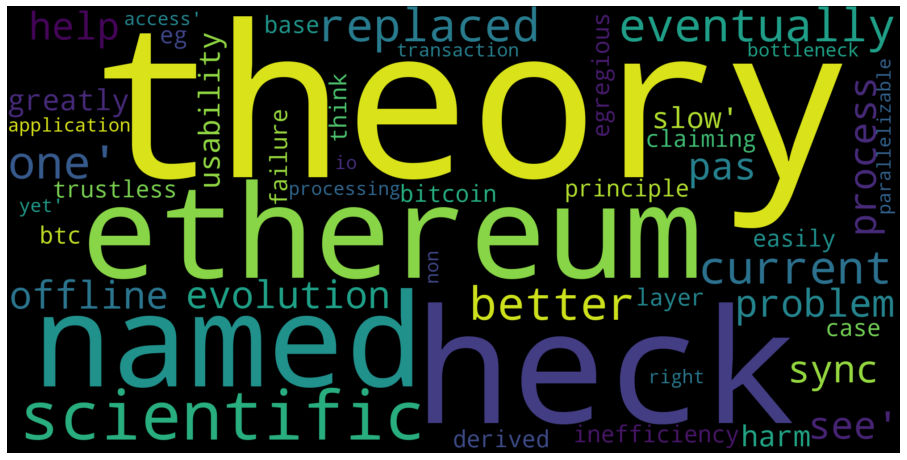

In [152]:
cleaned_wordcloud_generator(VitalikButerin)

In [153]:
set_date(VitalikButerin)

#creating the combined dataframe
VitalikButerin_combined = VitalikButerin.groupby(['tweet_day'])['cleaned_tweets'].apply(' ' .join).reset_index()

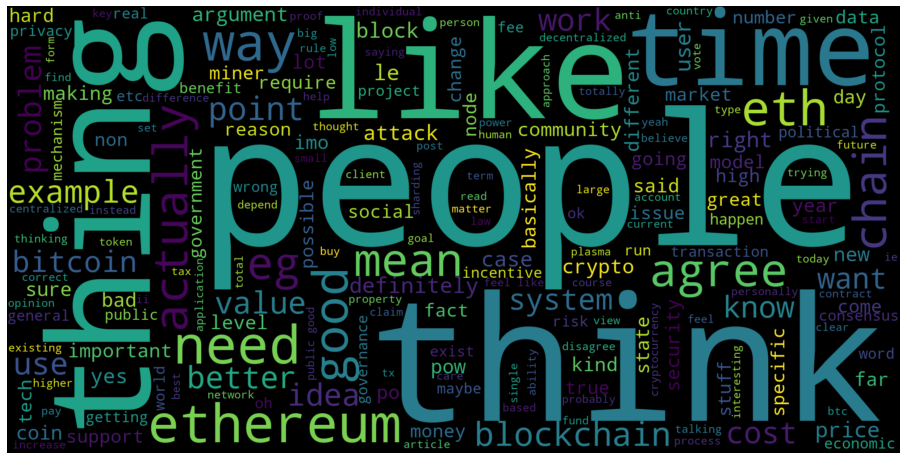

In [154]:
cleaned_wordcloud_generator(VitalikButerin_combined)

## Merging my influencers twitter data to the Bitcoin price index

In [155]:
#bringing in the bitcoin price index
bitcoin_price['date'] = pd.to_datetime(bitcoin_price['date'])
bitcoin_price.drop(axis=1, columns='Unnamed: 0', inplace=True)
bitcoin_price.set_index('date', drop=True, inplace=True)
bitcoin_price['date_stamp'] = bitcoin_price.index.date
bitcoin_price = bitcoin_price.sort_index()
bitcoin_price.head()

,open,high,low,close,volume,market_cap,date_stamp
date,,,,,,,
2013-04-29,134.44,147.49,134.00,144.54,0,1603768865,2013-04-29
2013-04-30,144.00,146.93,134.05,139.00,0,1542813125,2013-04-30
2013-05-01,139.00,139.89,107.72,116.99,0,1298954594,2013-05-01
2013-05-02,116.38,125.60,92.28,105.21,0,1168517495,2013-05-02
2013-05-03,106.25,108.13,79.10,97.75,0,1085995169,2013-05-03


In [156]:
#cutting it down to period where i have significant movement on the bitcoin price charts and scraped tweets for
bitcoin_price = bitcoin_price.loc[(bitcoin_price.index > '2016-12-31') & (bitcoin_price.index < '2020-07-02')]

In [157]:
bitcoin_price.head()

,open,high,low,close,volume,market_cap,date_stamp
date,,,,,,,
2017-01-01,963.66,1003.08,958.70,998.33,147775008,16050407461,2017-01-01
2017-01-02,998.62,1031.39,996.70,1021.75,222184992,16429024775,2017-01-02
2017-01-03,1021.60,1044.08,1021.60,1043.84,185168000,16786368910,2017-01-03
2017-01-04,1044.40,1159.42,1044.40,1154.73,344945984,18571869009,2017-01-04
2017-01-05,1156.73,1191.10,910.42,1013.38,510199008,16300254795,2017-01-05


In [158]:
# adding additional columns for analysis
bitcoin_price['daily_price_diff'] = bitcoin_price['close'].diff()
bitcoin_price['pct_change'] = bitcoin_price['close'].pct_change()

In [159]:
bitcoin_price['2017-12']

,open,high,low,close,volume,market_cap,date_stamp,daily_price_diff,pct_change
date,,,,,,,,,
2017-12-01,10198.6,11046.7,9694.65,10975.6,6783119872,183444663767,2017-12-01,742.0,0.072506
2017-12-02,10978.3,11320.2,10905.10,11074.6,5138500096,185122039035,2017-12-02,99.0,0.009020
2017-12-03,11082.7,11858.7,10862.00,11323.2,6608309760,189302389920,2017-12-03,248.6,0.022448
2017-12-04,11315.4,11657.2,11081.80,11657.2,6132409856,194912755450,2017-12-04,334.0,0.029497
2017-12-05,11685.7,12032.0,11604.60,11916.7,6895260160,199278350420,2017-12-05,259.5,0.022261
2017-12-06,11923.4,14369.1,11923.40,14291.5,12656300032,239024437136,2017-12-06,2374.8,0.199283
2017-12-07,14266.1,17899.7,14057.30,17899.7,17950699520,299405364249,2017-12-07,3608.2,0.252472
2017-12-08,17802.9,18353.4,14336.90,16569.4,21135998976,277185764485,2017-12-08,-1330.3,-0.074320
2017-12-09,16523.3,16783.0,13674.90,15178.2,13911300096,253946084745,2017-12-09,-1391.2,-0.083962


In [160]:
# adding in the influencers

# ensuring that dataframe is in line with bitcoin price

def df_converter(df):
    
    # empty cleaned tweet cells (stopwords or non-english entries might have been removed)
    df.drop(df.loc[df['cleaned_tweets']== ''].index, inplace=True)
    
    # sorting by date index and setting time period for analysis
    df.set_index('tweet_day', drop=True, inplace=True)
    df = df.sort_index()
    df = df.loc[(df.index > '2016-12-31') & (df.index < '2020-07-02')]
    
    return df

In [161]:
df_converter(aantonop_combined)
df_converter(APompliano_combined)
df_converter(brian_armstrong_combined)
df_converter(BitcoinMagazine_combined)
df_converter(CoinDesk_combined)
df_converter(CryptoDonAlt_combined)
df_converter(cz_binance_combined)
df_converter(jimmysong_combined)
df_converter(lopp_combined)
df_converter(PeterLBrandt_combined)
df_converter(PeterSchiff_combined)
df_converter(DoveyWan_combined)
df_converter(real_vijay_combined)
df_converter(rogerkver_combined)
df_converter(saifedean_combined)
df_converter(stephanlivera_combined)
df_converter(winklevoss_combined)
df_converter(VitalikButerin_combined)

,cleaned_tweets
tweet_day,
2017-01-01,cat bag taobao ii store mong kok hk prob place know
2017-01-02,version casper shipping return cost million youlkkk y
2017-01-03,usually multiple valley thinking plurality connotation many people almost u political reporting seems trend use describe going nabc sorry probably plane shanghai singapore please stop using word d...
2017-01-04,apologizes voting hillary problem bitcoinz without undesirable feature x would longer exist
2017-01-05,big long survey p np scott aaronson officer perhaps ultimate st century government
...,...
2020-06-27,de facto partial seizure property landowner renter landowner especially terrible group may net good distribution gain outweigh market inefficiency though imo tripling property tax putting revenue ...
2020-06-28,tauists need work harder education today tau circumference radius people know date different way limit government take small government principle understand perfectly compatible thing like ubi e...
2020-06-29,calling cold civil war cross shard communication asynchronous though could make highly scalable synchronous system using rollup ok sound spin gfw direction next question sophisticated ban anything...


In [162]:
bitcoin_price['aantonop'] = aantonop_combined['cleaned_tweets']
bitcoin_price['APompliano'] = APompliano_combined['cleaned_tweets']
bitcoin_price['aantonop'] = aantonop_combined['cleaned_tweets']
bitcoin_price['brian_armstrong'] = brian_armstrong_combined['cleaned_tweets']
bitcoin_price['BitcoinMagazine'] = BitcoinMagazine_combined['cleaned_tweets']
bitcoin_price['CoinDesk'] = CoinDesk_combined['cleaned_tweets']
bitcoin_price['CryptoDonAlt'] = CryptoDonAlt_combined['cleaned_tweets']
bitcoin_price['cz_binance'] = cz_binance_combined['cleaned_tweets']
bitcoin_price['jimmysong'] = jimmysong_combined['cleaned_tweets']
bitcoin_price['lopp'] = lopp_combined['cleaned_tweets']
bitcoin_price['PeterLBrandt'] = PeterLBrandt_combined['cleaned_tweets']
bitcoin_price['PeterSchiff'] = PeterSchiff_combined['cleaned_tweets']
bitcoin_price['DoveyWan'] = DoveyWan_combined['cleaned_tweets']
bitcoin_price['real_vijay'] = real_vijay_combined['cleaned_tweets']
bitcoin_price['rogerkver'] = rogerkver_combined['cleaned_tweets']
bitcoin_price['saifedean'] = saifedean_combined['cleaned_tweets']
bitcoin_price['stephanlivera'] = stephanlivera_combined['cleaned_tweets']
bitcoin_price['winklevoss'] = winklevoss_combined['cleaned_tweets']
bitcoin_price['VitalikButerin'] = VitalikButerin_combined['cleaned_tweets']

In [163]:
bitcoin_price.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1278 entries, 2017-01-01 to 2020-07-01
Data columns (total 27 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   open              1278 non-null   float64
 1   high              1278 non-null   float64
 2   low               1278 non-null   float64
 3   close             1278 non-null   float64
 4   volume            1278 non-null   int64  
 5   market_cap        1278 non-null   int64  
 6   date_stamp        1278 non-null   object 
 7   daily_price_diff  1277 non-null   float64
 8   pct_change        1277 non-null   float64
 9   aantonop          1114 non-null   object 
 10  APompliano        625 non-null    object 
 11  brian_armstrong   252 non-null    object 
 12  BitcoinMagazine   994 non-null    object 
 13  CoinDesk          746 non-null    object 
 14  CryptoDonAlt      852 non-null    object 
 15  cz_binance        668 non-null    object 
 16  jimmysong         1215 n

In [164]:
bitcoin_price.to_csv('./datasets/final_df.csv')

In [165]:
bitcoin_price.head()

,open,high,low,close,volume,market_cap,date_stamp,daily_price_diff,pct_change,aantonop,...,lopp,PeterLBrandt,PeterSchiff,DoveyWan,real_vijay,rogerkver,saifedean,stephanlivera,winklevoss,VitalikButerin
date,,,,,,,,,,,,,,,,,,,,,
2017-01-01,963.66,1003.08,958.70,998.33,147775008,16050407461,2017-01-01,NaN,NaN,everything taste mmmmmm poopic e oxioel going bean went standby reviewpic dp echtvux,...,thanks reminder add tried tell people right need tm fixed use segwit hard fork would cleaner happen time soon new new year mbga want understand bitcoin better epic list educational resource sugges...,factormembers robusta wk continuation h lcf fpic ecopyiict,NaN,NaN,NaN,happy new year bitcoin reason excited ever,NaN,NaN,NaN,cat bag taobao ii store mong kok hk prob place know
2017-01-02,998.62,1031.39,996.70,1021.75,222184992,16429024775,2017-01-02,23.42,0.023459,moving house vietnam full size fridge scooter didllmjf,...,great video added collection mulling back mind quite settled yet tax benefit really want delve detail suggest focusing security model think bitcoin energy expenditure need defended defends also th...,year profitable trade produced holding active trading nice graph dan tell story u middle class living decade actually surprised millennials even guessed well tmoeasgybr db bank forecast usdcnypic ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,version casper shipping return cost million youlkkk y
2017-01-03,1021.60,1044.08,1021.60,1043.84,185168000,16786368910,2017-01-03,22.09,0.021620,bitcoin q mimblewimble enhance privacy please remove list thank buy v early release oreilly first chapter drafted read come end get full book,...,indeed figure one price pay outspoken must invest resource security lost bitcoins firearm tragic boating accident tell anyone many btc unless trust w life merely mentioning owning btc may make tar...,control whether trade profitable job enter order nothing nothing le bottom platinum place pl f ptm ppltpic gh q l j measure trade whether make money good trade lose money ill conceived trade profi...,investor hoping big gain trump import tax get diminished dollar moawqpqm h podcast tax cut big gov spending economic sedative rather cure,NaN,NaN,built bitcoin original principle privacy decentralization open development scaleability fungibility,NaN,NaN,NaN,usually multiple valley thinking plurality connotation many people almost u political reporting seems trend use describe going nabc sorry probably plane shanghai singapore please stop using word d...
2017-01-04,1044.40,1159.42,1044.40,1154.73,344945984,18571869009,2017-01-04,110.89,0.106233,early yes thank think nd edition much improved march ish currently finishing chapter want understand bitcoin matter internet money non technical book wow thanks quote,...,going live hour w speaking revolutionizing internet architecture well suffice say calculator based upon wtf live hour ago lucky miner txn hash tx creator ask nicely return fee implied bitcoin what...,patience discipline trade well defined geometric price pattern predetermined risk trade mgmt provides trading edge eurocurrency became official jan eurusd e f prior eur plotted based trade weighte...,NaN,NaN,NaN,seen bitcoin reaching time new high unseen high would reached followed satoshi road map,NaN,NaN,NaN,apologizes voting hillary problem bitcoinz without undesirable feature x would longer exist
2017-01-05,1156.73,1191.10,910.42,1013.38,510199008,16300254795,2017-01-05,-141.35,-0.122410,bitcoin q earn bitcoins instead buying successful video youtube channel introduction bitcoin think simply using term regulated bitcoin differently really still largely unregulated need license cre...,...,sound like coinbase gdax hurting worst also heard complaint slowness kraken biggest surprise week price volatility rather btc exchange still robust enough handle peak traffic bitcoin died sooner e...,trader employ rule must live market provides premium alert issued factor special situation report update january minneapolis wheat see f

In [166]:
final_df = pd.read_csv('./datasets/final_df.csv')

## Creating the target variable

In [167]:
# creating the target variable

threshold = (final_df['pct_change'].mean())+((final_df['pct_change'].std()))
neg_threshold = (final_df['pct_change'].mean())-((final_df['pct_change'].std()))

# 0 = negative class where the bitcoin close percentage change day on day is more than one negative standard deviation
# 1 = neutral class where price movement is under one standard deviation and not significant
# 2 = positive class where the bitcoin close percentage change day on day is more than one positive standard deviation
final_df['target'] = final_df['pct_change'].map(lambda x: 1 if x > threshold or  x < neg_threshold else 0)

In [168]:
final_df[['close', 'pct_change', 'target']].head(20)

,close,pct_change,target
0,998.33,NaN,0
1,1021.75,0.023459,0
2,1043.84,0.021620,0
3,1154.73,0.106233,1
4,1013.38,-0.122410,1
5,902.20,-0.109712,1
6,908.59,0.007083,0
7,911.20,0.002873,0
8,902.83,-0.009186,0
9,907.68,0.005372,0


In [169]:
final_df['target'].value_counts(normalize=True)

0    0.776995
1    0.223005
Name: target, dtype: float64

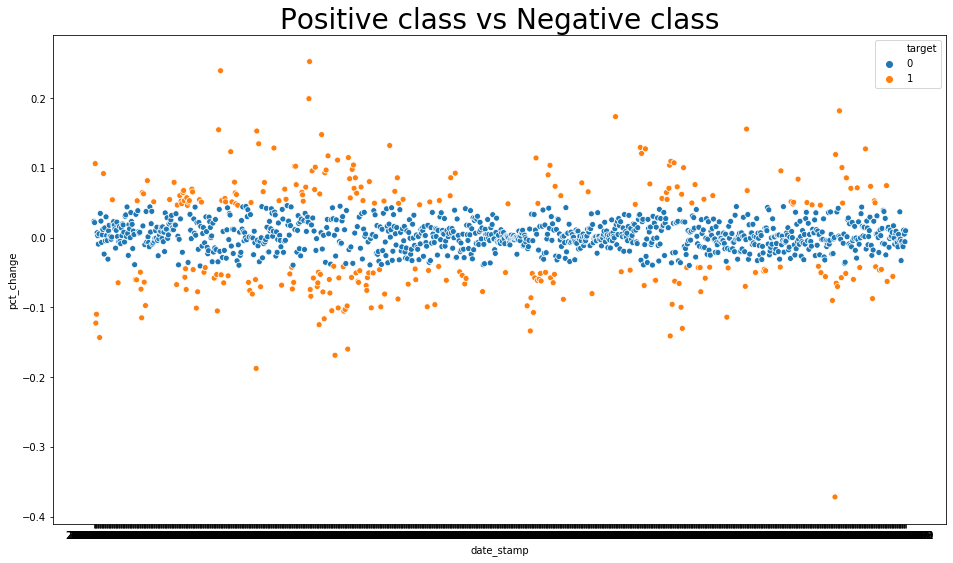

In [180]:
plt.figure(figsize=(16,9))
sns.scatterplot(x=final_df['date_stamp'], 
                y=final_df['pct_change'],
                hue=final_df['target'])
plt.title('Positive class vs Negative class', fontsize= 28);

In [170]:
final_df.to_csv('./datasets/final_df.csv')